In [14]:
from nltk.corpus import stopwords 
from nltk.tokenize import word_tokenize 
import nltk
import pandas as pd
import numpy as np
import re
import pprint

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# spacy for lemmatization
import spacy

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [15]:
r = open('stop_words.txt', mode = 'rt', encoding='utf-8')
stop_read = r.read()
stop_words=stop_read.split(' ')
print(stop_words)

['굿', '게임', '은', '는', '이', '가', '~', '잼', '것', '꿀', '진짜', '할', '수', '의', '같아요', '플레이', '재미나', '!!!', '다른', '그', '아', '재미있네요', '완전', '다시', '있어요', '좋은데', '네', '해', '있는', '그냥', '이런', '갓', 'ㅋㅋ', '인', '합니다', 'game', '중', '굳', '나', '고', '못', '!!', '게', 'ㅎㅎ', '만', '하면', '^^', 'Good', '님', '재밌네요', '광고', '입니다', '잘', '한', '하는', '저', '근데', '그리고', '해주세요', '개', '와', '으로', '짱', '업데이트', '거', '안', '에서', 'ㅋ', 'ㅠㅠ', '너무', '좋아요', '도', '을', '.', '에', '요', '제', '가', '재밌어요', '!', '정말', '...', '..', '넘', '?', '하고', '때', '재미있어요', '를', '들', '많이', '최고', '좀', '재미', '다', '더', '로', '내', '이', '있', '하', '것', '들', '그', '되', '수', '이', '보', '않', '없', '나', '사람', '주', '아니', '등', '같', '우리', '때', '년', '한', '가', '지', '대하', '오', '말', '일', '그렇', '위하', '때문', '그것', '두', '말하', '알', '받', '못하', '일', '그런', '또', '문제', '더', '사회', '많', '그리고', '좋', '크', '따르', '중', '나오', '가지', '씨', '시키', '만들', '지금', '생각하', '그러', '속', '하나', '살', '모르', '적', '월', '데', '자신', '안', '어떤', '내', '경우', '명', '생각', '그녀', '다시', '이런', '앞', '보이', '번', '나', '다른', '어떻',

In [16]:
df = pd.read_csv('all_reviews.csv', error_bad_lines=False)

df.replace(np.nan, '', regex=True)    #nan replace
df.head()

,Unnamed: 0,name,review
0,0.0,60 Seconds! Atomic Adventure,한글 옵션 가서 변경하면 잘 번역되어있고 영상 보기만 하고 폰으로 시작해서 조작감...
1,1.0,60 Seconds! Atomic Adventure,언어는 본인이 알아서 옵션 들어가서 바꿔야지 그게 기본 중에 기본이잖아요 그런 것...
2,2.0,60 Seconds! Atomic Adventure,조작감 구린 거 빼고는 다 만족합니다. 그리고 한국어 안된다 하시는 분들 그 옵션...
3,3.0,60 Seconds! Atomic Adventure,제가 꼭 해보고 싶었던 게임인데 이렇게 할 수 있어서 좋네요!! 좀 비싸서 고민하...
4,4.0,60 Seconds! Atomic Adventure,저는 이 게임이 꿀 잼입니다만 총이나 기타 같은 걸로 밖에 탐사하러나가서 몬스터나...


In [17]:
#df2 = pd.read_csv('top_10_comm.csv', error_bad_lines=False)
#df2.info()

In [18]:
data = df.review.values.tolist()
#comm = df2.review.values.tolist()
print(len(data))
#print(len(comm))

36356


In [29]:
from konlpy.tag import Twitter; t = Twitter()

tokens_ko_ex = t.morphs(str(data))
result_ex = []
for w in tokens_ko_ex: 
    if w not in stop_words: 
        result_ex.append(w) 

In [32]:
ko_ex = nltk.Text(result_ex, name = 'ex')
print(len(set(ko_ex.tokens)))
print(ko_ex[:10])

28521
["['", '한글', '옵션', '가서', '변경', '번역', '되어있고', '영상', '보기', '시작']


In [58]:
type(ko_ex)

nltk.text.Text

In [48]:
from konlpy.tag import Twitter; t = Twitter()

tokens_ko = []
for word in data:
    tmp_list = t.morphs(str(word))
    tokens_ko.append(tmp_list)
    #print(word)
    #tmp_list = t.morphs(str(data))   ##docs toknizing data : reviews.tolist

    
result = []
tmp = []

for word in tokens_ko: 
    tmp = []
    for w in word:
        if w not in stop_words: 
            tmp.append(w)
    
    result.append(tmp)
        
print(len(result))     #195671
print(len(tokens_ko))

36356
36356


In [49]:
print(result[:1])

[['한글', '옵션', '가서', '변경', '번역', '되어있고', '영상', '보기', '시작', '조작', '감', '힘들지만', '적응하면', '될', '같고', '자주', '아닌데', '할인', '했을', '구매', '과자', '봉지', '값', '싸게', '삼', '2~3', '질릴', '있으나', '심심할', '하기', '좋음', '할인', '노려', '구매', '좋을']]


In [132]:
#tokens_comm = t.morphs(str(comm))
#comm_ko = nltk.Text(tokens_comm, name='token_comm')

In [47]:
ko = nltk.Text(result, name='tokens_ko')   
for k in result:
    ko.append(nltk.Text(k, name = k))

print(len(ko))
print(len(set(ko.tokens))) # returns number of unique tokens
ko.vocab()                  # returns frequency distribution

AttributeError: 'Text' object has no attribute 'append'

In [35]:
from konlpy.tag import Twitter; t = Twitter()

pos = lambda d: ['/'.join(p) for p in t.pos(d, stem=True, norm=True)]
texts_ko = [pos(doc) for doc in ko]
#print(texts_ko)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/konlpy/tag/_okt.py:16: UserWarning: "Twitter" has changed to "Okt" since KoNLPy v0.4.5.
  warn('"Twitter" has changed to "Okt" since KoNLPy v0.4.5.')


RuntimeError: No matching overloads found for tokenize in find. at native/common/jp_method.cpp:127

In [131]:
print(len(texts_ko))

195671
195671


In [77]:
noun_adj_list = []

for word in texts_ko:
    if str(word).split('/')[1] == 'Adjective\']' or str(word).split('/')[1] == 'Noun\']':    #형용사, 명사
        noun_adj_list.append(word)
        

In [78]:
stop_adj = ['[\'재밌다/Adjective\']', '[\'즐겁다/Adjective\']','[\'좋다/Adjective\']','[\'없다/Adjective\']','[\'있다/Adjective\']',
           '[\'어떻다/Adjective\']', '[\'아니다/Adjective\']', '[\'재미있다/Adjective\']', '[\'좋다/Adjective\']', '[\'괜찮다/Adjective\']',
           '[\'당연하다/Adjective\']', '[\'많다/Adjective\']', '[\'가능하다/Adjective\']', '[\'괜찮다/Adjective\']', '[\'같다/Adjective\']',
           '[\'재미나다/Adjective\']' , '[\'부탁드리다/Adjective\']' , '[\'그렇다/Adjective\']', '[\'좋아하다/Adjective\']', '[\'재미나다/Adjective\']', 
           '[\'아깝다/Adjective\']', '[\'안되다/Adjective\']', '[\'전/Noun\']', '[\'과/Noun\']', '[\'분/Noun\']', '[\'앱/Noun\']', '[\'영어/Noun\']',
           '[\'한글/Noun\']', '[\'여러분/Noun\']', '[\'다만/Noun\']', '[\'님들/Noun\']', '[\'다만/Noun\']', '[\'삭제/Noun\']', '[\'리뷰/Noun\']',
           '[\'꼭/Noun\']', '[\'후/Noun\']', '[\'처럼/Noun\']', '[\'환불/Noun\']']

In [79]:
texts_ko = []
for word in noun_adj_list:
    if str(word) not in stop_adj:
        texts_ko.append(word)

In [117]:
print(len(texts_ko))

91197


In [50]:
#create id2word
from gensim import corpora
#dictionary_ko = corpora.Dictionary(texts_ko)
dictionary_ko = corpora.Dictionary(result)
#dictionary_ko.save(u'ko.dict')  # save dictionary to file for future use

from gensim import models

tf_ko = [dictionary_ko.doc2bow(text) for text in result]

#tf_ko = [dictionary_ko.doc2bow(text) for text in texts_ko]
tfidf_model_ko = models.TfidfModel(tf_ko)
tfidf_ko = tfidf_model_ko[tf_ko]
#corpora.MmCorpus.serialize('ko.mm', tfidf_ko) # save corpus to file for future use

In [135]:
'''
#create id2word
from gensim import corpora
dictionary_comm_ko = corpora.Dictionary(texts_comm_ko)
#dictionary_ko.save(u'ko.dict')  # save dictionary to file for future use

from gensim import models
tf_comm_ko = [dictionary_ko.doc2bow(text) for text in texts_comm_ko]
#tfidf_model_ko = models.TfidfModel(tf_ko)
#tfidf_ko = tfidf_model_ko[tf_ko]
#corpora.MmCorpus.serialize('ko.mm', tfidf_ko) # save corpus to file for future use
'''

In [51]:
import numpy as np; np.random.seed(42)  # optional
import pprint

ntopics = 5
nwords = 5

lda_ko = models.ldamodel.LdaModel(tfidf_ko, id2word=dictionary_ko, num_topics=ntopics)
pprint.pprint(lda_ko.print_topics(num_topics=ntopics, num_words=nwords))

from gensim.models import word2vec
wv_model_ko = word2vec.Word2Vec(result)

#wv_model_ko = word2vec.Word2Vec(texts_ko)

wv_model_ko.init_sims(replace=True)
#wv_model_ko.save('ko_word2vec.model')


[(0, '0.029*"귀여워요" + 0.012*"안젤라" + 0.011*"~~" + 0.009*"톰" + 0.007*"동생"'),
 (1, '0.018*"때우기" + 0.013*"~^^" + 0.008*"재미있음" + 0.007*"보내기" + 0.005*"해보세요"'),
 (2, '0.013*"중독" + 0.011*"좋아" + 0.009*"성" + 0.009*"재미있게" + 0.007*"ㅎ"'),
 (3, '0.020*"♡" + 0.019*"좋음" + 0.016*"고양이" + 0.014*"귀엽고" + 0.011*"\uf44d"'),
 (4, '0.009*"♥" + 0.008*"심심할" + 0.008*"안젤라" + 0.008*"키우는" + 0.007*"!!!!"')]


In [52]:
import gensim

lda_model = gensim.models.ldamodel.LdaModel(corpus=tf_ko,
id2word=dictionary_ko,
num_topics=5,
random_state=100,
update_every=1,
chunksize=100,
passes=10,
alpha='auto',
per_word_topics=True)

doc_lda = lda_model[tf_ko]
import pprint

pprint.pprint(lda_model.print_topics())


[(0,
  '0.025*"귀엽고" + 0.015*"있어서" + 0.012*"이에요" + 0.009*"안젤라" + 0.009*"좋습니다" + '
  '0.009*"대박" + 0.009*"재밌게" + 0.008*"귀여운" + 0.008*"♡♡" + 0.008*"~~^^"'),
 (1,
  '0.041*"♡" + 0.021*"재미있고" + 0.017*"때우기" + 0.017*"좋음" + 0.016*"심심할" + '
  '0.012*"ㅎ" + 0.011*"~~~" + 0.010*"ㅜㅜ" + 0.010*"하게" + 0.009*"용"'),
 (2,
  '0.033*"귀여워요" + 0.022*"안젤라" + 0.012*"♥" + 0.010*"톰" + 0.010*"키우는" + '
  '0.009*"마이" + 0.009*"스트레스" + 0.009*"아이템" + 0.007*"5" + 0.007*"꼭"'),
 (3,
  '0.024*"중독" + 0.017*"성" + 0.016*"좋아" + 0.011*"너" + 0.009*"좋겠어요" + 0.009*"여" '
  '+ 0.009*"동생" + 0.008*"하는데" + 0.008*"안젤라" + 0.008*"전"'),
 (4,
  '0.027*"고양이" + 0.024*"줄" + 0.023*"가는" + 0.018*"재밌고" + 0.016*"~~" + '
  '0.014*"하트" + 0.014*"~^^" + 0.014*"아기" + 0.011*"레벨" + 0.010*"\uf44d"')]


In [30]:
'''
print('\nPerplexity: ', lda_model.log_perplexity(tf_ko)) 
#모델난이도, 낮을수록 좋음

coherence_model_lda = CoherenceModel(model=lda_model, texts=texts_ko, dictionary=dictionary_ko, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)
#일관성 점수
'''


Perplexity:  -9.505759203958887

Coherence Score:  0.8451273616031285


In [53]:
# Plotting tools
import pyLDAvis
import pyLDAvis.gensim # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, tf_ko, dictionary_ko)
vis

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.092867 -0.161753       1        1  24.929455
3     -0.103416  0.213108       2        1  22.497337
0     -0.041195 -0.065382       3        1  18.465281
4      0.246993  0.017376       4        1  17.859264
1     -0.009515 -0.003349       5        1  16.248661, topic_info=      Category         Freq   Term        Total  loglift  logprob
term                                                             
848    Default  1254.000000      ♡  1254.000000  30.0000  30.0000
2649   Default  1544.000000   귀여워요  1544.000000  29.0000  29.0000
303    Default   905.000000    고양이   905.000000  28.0000  28.0000
1360   Default  1038.000000     중독  1038.000000  27.0000  27.0000
1716   Default   885.000000    귀엽고   885.000000  26.0000  26.0000
182    Default   795.000000      줄   795.000000  25.0000  25.0000
1449   Default   782.000000     가는   782.000000  24.0000  24.0000
1286   Default   644.000000   재미있고   644.000000  23.0000  23.0000
1207   Default   709.000000      성   709.000000  22.0000  22.0000
247    Default   609.000000    재밌고   609.000000  21.0000  21.0000
1187   Default   668.000000     좋아   668.000000  20.0000  20.0000
1285   Default   533.000000    때우기   533.000000  19.0000  19.0000
26     Default   522.000000     좋음   522.000000  18.0000  18.0000
220    Default   535.000000     ~~   535.000000  17.0000  17.0000
16     Default   504.000000    심심할   504.000000  16.0000  16.0000
85     Default   511.000000    있어서   511.000000  15.0000  15.0000
5683   Default   489.000000     하트   489.000000  14.0000  14.0000
1126   Default   475.000000    ~^^   475.000000  13.0000  13.0000
9524   Default   460.000000     아기   460.000000  12.0000  12.0000
991    Default   569.000000      ♥   569.000000  11.0000  11.0000
358    Default   422.000000    이에요   422.000000  10.0000  10.0000
102    Default   375.000000      ㅎ   375.000000   9.0000   9.0000
115    Default   448.000000      너   448.000000   8.0000   8.0000
1452   Default   385.000000     레벨   385.000000   7.0000   7.0000
3422   Default   463.000000    키우는   463.000000   6.0000   6.0000
13758  Default   445.000000     마이   445.000000   5.0000   5.0000
235    Default   337.000000    ~~~   337.000000   4.0000   4.0000
317    Default   401.000000   좋겠어요   401.000000   3.0000   3.0000
1569   Default   424.000000   스트레스   424.000000   2.0000   2.0000
753    Default   424.000000    아이템   424.000000   1.0000   1.0000
...        ...          ...    ...          ...      ...      ...
1286    Topic5   643.005432   재미있고   644.189453   1.8153  -3.8655
1285    Topic5   532.116089    때우기   533.281860   1.8150  -4.0548
26      Topic5   521.210571     좋음   522.376221   1.8149  -4.0755
16      Topic5   503.819641    심심할   504.994202   1.8148  -4.1095
102     Topic5   374.574127      ㅎ   375.744690   1.8140  -4.4059
235     Topic5   336.381409    ~~~   337.566162   1.8136  -4.5134
818     Topic5   300.864746     ㅜㅜ   302.052765   1.8132  -4.6250
2191    Topic5   291.643646     하게   292.827911   1.8131  -4.6561
3659    Topic5   281.780304      용   282.954834   1.8130  -4.6905
2037    Topic5   270.670380      어   271.861725   1.8128  -4.7308
1043    Topic5   246.242905   !!!!   247.422668   1.8124  -4.8254
28      Topic5   234.550903     하기   235.716553   1.8122  -4.8740
2192    Topic5   185.630600    ㅋㅋㅋ   186.799118   1.8109  -5.1079
224     Topic5   183.978760    같네요   185.162460   1.8107  -5.1169
103     Topic5   177.321075      난   178.489471   1.8106  -5.1537
465     Topic5   175.704132      서   176.875015   1.8105  -5.1629
184     Topic5   175.348572     환불   176.532745   1.8104  -5.1649
3804    Topic5   171.291809   킬링타임   172.456787   1.8104  -5.1883
827     Topic5   163.322937     처럼   164.519257   1.8099  -5.2359
842     Topic5   161.004730     다음   162.190643   1.8098  -5.2502
79      Topic5   155.648041     돼서   156.834412   1.8096  -5.2841
136     Topic5 

In [54]:
mallet_path = 'mallet-2.0.8/bin/mallet' # update this path
ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, corpus=tf_ko, num_topics=7, id2word=dictionary_ko)
pprint.pprint(ldamallet.show_topics(formatted=False))

[(0,
  [('환불', 0.01596884128529698),
   ('이에요', 0.015657254138266796),
   ('어떻게', 0.0150730282375852),
   ('추천', 0.01456669912366115),
   ('대박', 0.013125608568646543),
   ('친구', 0.012891918208373905),
   ('주세요', 0.012697176241480038),
   ('ㅎ', 0.012697176241480038),
   ('만들어', 0.011256085686465434),
   ('랑', 0.010866601752677701)]),
 (1,
  [('별', 0.01860410921660776),
   ('맵', 0.01798267759350604),
   ('좋음', 0.016040703771313163),
   ('(', 0.01592418534198159),
   (')', 0.014215248378451858),
   ('5', 0.01402105099623257),
   ('ㅠ', 0.010642016545616965),
   ('캐릭터', 0.010486658639841535),
   ('좋아', 0.010059424398959103),
   ('한글', 0.009437992775857381)]),
 (2,
  [('줄', 0.016943784639746634),
   ('~~', 0.015003958828186857),
   ('개꿀', 0.013539192399049882),
   ('재미있고', 0.012430720506730008),
   ('이다', 0.011916072842438638),
   ('가는', 0.011599366587490103),
   ('이건', 0.011163895486935867),
   ('영어', 0.010807600950118765),
   ('하게', 0.010451306413301662),
   ('재밌습니다', 0.010292953285827395)

In [42]:
print(len(ldamallet[tf_ko]))

36356


In [57]:
# Compute Coherence Score
#texts = texta_ko
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=result, dictionary=dictionary_ko, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('\nCoherence Score: ', coherence_ldamallet)
pprint.pprint(ldamallet[tf_ko])  # 0~ 8까지 튜플로 이루어진게 첫번째리뷰가 0번째 속할 확률


Coherence Score:  0.3146618800278715
[[(0, 0.17422969187675072),
  (1, 0.12717086834733893),
  (2, 0.19122315592903827),
  (3, 0.08403361344537817),
  (4, 0.20952380952380953),
  (5, 0.0866479925303455),
  (6, 0.12717086834733893)],
 [(0, 0.09126984126984125),
  (1, 0.11525974025974023),
  (2, 0.22384559884559882),
  (3, 0.12914862914862912),
  (4, 0.12788600288600285),
  (5, 0.14177489177489175),
  (6, 0.1708152958152958)],
 [(0, 0.10504201680672272),
  (1, 0.13281979458450047),
  (2, 0.17203548085901024),
  (3, 0.11974789915966386),
  (4, 0.13445378151260504),
  (5, 0.11974789915966386),
  (6, 0.2161531279178338)],
 [(0, 0.15463389656938042),
  (1, 0.11699948796722992),
  (2, 0.12954429083461338),
  (3, 0.21198156682027647),
  (4, 0.14388120839733742),
  (5, 0.1277521761392729),
  (6, 0.11520737327188942)],
 [(0, 0.1418951418951419),
  (1, 0.13684463684463685),
  (2, 0.13852813852813853),
  (3, 0.12337662337662338),
  (4, 0.12337662337662338),
  (5, 0.1402116402116402),
  (6, 0.1957

 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1487706193588547),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1509492685963274)],
 [(0, 0.13736263736263735),
  (1, 0.17582417582417575),
  (2, 0.13736263736263735),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.17250673854447438),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.1536388140161725)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.1334674714956405),
  (1, 0.1710261569416499),
  (2, 0.12251285490722111),
  (3, 0.11938296445338699),
  (4, 0.23362396601833227),
  (5, 0.10060362173038233),
  (6, 0.11938296445338699)],
 [(0, 0.12294861447403822),
  (

  (4, 0.13736263736263737),
  (5, 0.15659340659340656),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.16962805022506514),
  (1, 0.14972755271262733),
  (2, 0.10660980810234544),
  (3, 0.15304430229803362),
  (4, 0.1215351

  (3, 0.15079365079365076),
  (4, 0.1322751322751323),
  (5, 0.16931216931216928),
  (6, 0.1322751322751323)],
 [(0, 0.13477088948787064),
  (1, 0.1536388140161725),
  (2, 0.1536388140161725),
  (3, 0.13477088948787064),
  (4, 0.1536388140161725),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.1536388140161725),
  (3, 0.13477088948787064),
  (4, 0.1536388140161725),
  (5, 0.1536388140161725),
  (6, 0.13477088948787064)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263735),
  (1, 0.1394993894993895),
  (2, 0.15659340659340654),
  (3, 0.1373626373626373

  (6, 0.1414399092970521)],
 [(0, 0.17089947089947088),
  (1, 0.11904761904761907),
  (2, 0.15238095238095234),
  (3, 0.1283068783068783),
  (4, 0.11904761904761907),
  (5, 0.11904761904761907),
  (6, 0.19126984126984126)],
 [(0, 0.1480654761904762),
  (1, 0.12723214285714285),
  (2, 0.14459325396825398),
  (3, 0.1932043650793651),
  (4, 0.1116071428571429),
  (5, 0.12723214285714285),
  (6, 0.1480654761904762)],
 [(0, 0.13477088948787064),
  (1, 0.1536388140161725),
  (2, 0.1536388140161725),
  (3, 0.13477088948787064),
  (4, 0.1536388140161725),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.13386243386243382),
  (1, 0.13571428571428568),
  (2, 0.11904761904761907),
  (3, 0.13386243386243382),
  (4, 0.1542328042328042),
  (5, 0.11904761904761907),
  (6, 0.2042328042328042)],
 [(0, 0.18278769841269837),
  (1, 0.14459325396825393),
  (2, 0.13938492063492058),
  (3, 0.14285714285714282),
  (4, 0.12028769841269843),
  (5, 0.12723214285714282),
  (6, 0.14285714285714282)

  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1509492685963274),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1465919701213819),
  (6, 0.14223467164643636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.15966386554621845),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.142

  (6, 0.13433274544385657)],
 [(0, 0.16621743036837375),
  (1, 0.1578316861335729),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.13686732554657086),
  (6, 0.13477088948787064)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.15573525007487268),
  (3, 0.15154237795747227),
  (4, 0.1536388140161725),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.1561327561327561),
  (1, 0.12987012987012989),
  (2, 0.12987012987012989),
  (3, 0.12987012987012989),
  (4, 0.17027417027417024),
  (5, 0.14805194805194802),
  (6, 0.13593073593073596)],
 [(0, 0.14805194805194802),
  (1, 0.12987012987012989),
  (2, 0.12987012987012989),
  (3, 0.12987012987012989),
  (4, 0.14805194805194802),
  (5, 0.1662337662337662),
  (6, 0.14805194805194802)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.1536388140161725),
  (3, 0.13686732554657086),
  (4, 0.17041030248577416),
  (5, 0.13477088948787064),
  (6, 0.134770889487

  (1, 0.12527472527472527),
  (2, 0.12527472527472527),
  (3, 0.17142857142857143),
  (4, 0.10989010989010992),
  (5, 0.17142857142857143),
  (6, 0.15604395604395602)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.15659340659340656),
  (4, 0.13736263736263737),
  (5, 0.15659340659340656),
  (6, 0.13736263736263737)],
 [(0, 0.11904761904761907),
  (1, 0.16904761904761903),
  (2, 0.15238095238095234),
  (3, 0.13571428571428568),
  (4, 0.11904761904761907),
  (5, 0.13571428571428568),
  (6, 0.16904761904761903)],
 [(0, 0.14944594189877206),
  (1, 0.17250673854447438),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.13686732554657086),
  (5, 0.13477088948787064),
  (6, 0.13686732554657086)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323),
  (2, 0.1322751322751323),
  (3, 0.18783068783068776),
  (4, 0.1322751322751323),
  (5, 0.15079365079365076),
  (6, 0.1322751322751323)],
 [(0, 0.14285714285714285),
  (1, 0.142857142857

  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.14223467164643636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.14223467164643636),
  (5, 0.1400560224089636),
  (6, 0.1553065670712729)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.15659340659340656),
  (1, 0.15659340659340656),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),


 [(0, 0.13477088948787064),
  (1, 0.1536388140161725),
  (2, 0.1536388140161725),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.1536388140161725)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.15659340659340656),
  (3, 0.15659340659340656),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.17368742368742363),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13949938949938953)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.15966386554621845),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (

  (3, 0.11579161579161579),
  (4, 0.26821326821326824),
  (5, 0.12576312576312576),
  (6, 0.13715913715913716)],
 [(0, 0.13492063492063494),
  (1, 0.14746543778801843),
  (2, 0.14746543778801843),
  (3, 0.13133640552995393),
  (4, 0.1797235023041475),
  (5, 0.11699948796722996),
  (6, 0.14208909370199693)],
 [(0, 0.16634920634920636),
  (1, 0.17375661375661375),
  (2, 0.1011640211640212),
  (3, 0.1456084656084656),
  (4, 0.1619047619047619),
  (5, 0.1219047619047619),
  (6, 0.1293121693121693)],
 [(0, 0.10052910052910051),
  (1, 0.10052910052910051),
  (2, 0.12933568489124045),
  (3, 0.11013129531648048),
  (4, 0.21849892220262593),
  (5, 0.1361943954536547),
  (6, 0.20478150107779738)],
 [(0, 0.17572099262240107),
  (1, 0.13972725240330874),
  (2, 0.12720769058797227),
  (3, 0.14598703331097695),
  (4, 0.13190252626872345),
  (5, 0.14285714285714285),
  (6, 0.1365973619494746)],
 [(0, 0.12138188608776844),
  (1, 0.12955182072829133),
  (2, 0.10504201680672273),
  (3, 0.165499533146592

  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089

  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.15312791783380017),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1465919701213819),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.1428571428571

  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.19137466307277626),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.1428571428571

 [(0, 0.13639035861258086),
  (1, 0.1322751322751323),
  (2, 0.1322751322751323),
  (3, 0.16931216931216928),
  (4, 0.1322751322751323),
  (5, 0.1651969429747207),
  (6, 0.1322751322751323)],
 [(0, 0.1536388140161725),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.1536388140161725),
  (4, 0.1536388140161725),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.14805194805194805),
  (1, 0.1298701298701299),
  (2, 0.16623376623376623),
  (3, 0.1298701298701299),
  (4, 0.1298701298701299),
  (5, 0.14805194805194805),
  (6, 0.14805194805194805)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.17582417582417575)],
 [(0, 0.14480646059593427),
  (1, 0.1253132832080201),
  (2, 0.14090782511835143),
  (3, 0.16235032024505708),
  (4, 0.14090782511835143),
  (5, 0.15845168476747423),
  (6, 0.12726260094681152)],
 [(0, 0.14805194805194805),

  (3, 0.2039278988431531),
  (4, 0.15496368038740918),
  (5, 0.13801452784503632),
  (6, 0.12106537530266348)],
 [(0, 0.13686732554657086),
  (1, 0.1536388140161725),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.16831386642707397),
  (5, 0.13686732554657086),
  (6, 0.13477088948787064)],
 [(0, 0.1272626009468115),
  (1, 0.14285714285714282),
  (2, 0.12531328320802007),
  (3, 0.16429963798384847),
  (4, 0.16819827346143132),
  (5, 0.14285714285714282),
  (6, 0.1292119186856029)],
 [(0, 0.1313364055299539),
  (1, 0.2119815668202765),
  (2, 0.11520737327188943),
  (3, 0.1474654377880184),
  (4, 0.11520737327188943),
  (5, 0.11520737327188943),
  (6, 0.16359447004608293)],
 [(0, 0.1403940886699507),
  (1, 0.1403940886699507),
  (2, 0.17296113847837985),
  (3, 0.12506841817186648),
  (4, 0.12315270935960594),
  (5, 0.12315270935960594),
  (6, 0.17487684729064037)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),


  (6, 0.14805194805194802)],
 [(0, 0.13477088948787064),
  (1, 0.1536388140161725),
  (2, 0.1536388140161725),
  (3, 0.1536388140161725),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.17250673854447438),
  (4, 0.1536388140161725),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.13477088948787064),
  (1, 0.17250673854447438),
  (2, 0.1515423779574723),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.13686732554657086),
  (6, 0.13477088948787064)],
 [(0, 0.1536388140161725),
  (1, 0.1536388140161725),
  (2, 0.13477088948787064),
  (3, 0.1536388140161725),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.13736263736263735),
  (1, 0.1394993894993895),
  (2, 0.15659340659340654),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.1544566544566544

  (2, 0.19137466307277626),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.1437728937728938),
  (1, 0.15018315018315012),
  (2, 0.1523199023199023),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.14163614163614166)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.15966386554621845),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.13593073593073596),
  (1, 0.14805194805194802),
  (2, 0.14805194805194802),
 

  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13949938949938953),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.17368742368742363),
  (6, 0.13736263736263737)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323),
  (2, 0.1322751322751323),
  (3, 0.15079365079365076),
  (4, 0.15079365079365076),
  (5, 0.15079365079365076),
  (6, 0.15079365079365076)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1324404761904762),
  (1, 0.12723214285714285),
  (2, 0.14285714285714288),
  (3, 0.15674603174603174),
  (4, 0.1671626984126984),
  (5, 0.14112103174603177),
  (6, 0.1324404761904762)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.1536388140161725),
  (3, 0.17250673854447438),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),


 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.14804639804639802),
  (3, 0.13736263736263737),
  (4, 0.15659340659340656),
  (5, 0.14590964590964592),
  (6, 0.13736263736263737)],
 [(0, 0.15659340659340656),
  (1, 0.15659340659340656),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.17582417582417575),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1596638

  (4, 0.14603174603174598),
  (5, 0.141991341991342),
  (6, 0.14805194805194802)],
 [(0, 0.14805194805194805),
  (1, 0.1298701298701299),
  (2, 0.1298701298701299),
  (3, 0.14805194805194805),
  (4, 0.1298701298701299),
  (5, 0.14805194805194805),
  (6, 0.16623376623376623)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.15659340659340656),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.15659340659340656)],
 [(0, 0.13477088948787064),
  (1, 0.1536388140161725),
  (2, 0.13477088948787064),
  (3, 0.1536388140161725),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.1536388140161725)],
 [(0, 0.15079365079365076),
  (1, 0.13433274544385657),
  (2, 0.1322751322751323),
  (3, 0.18577307466196352),
  (4, 0.1322751322751323),
  (5, 0.1322751322751323),
  (6, 0.1322751322751323)],
 [(0, 0.12531328320802007),
  (1, 0.16235032024505705),
  (2, 0.12531328320802007),
  (3, 0.15650236702868278),
  (4, 0.12531328320802007),

 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.17582417582417575),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.14377289377289376),
  (4, 0.15659340659340656),
  (5, 0.13736263736263737),
  (6, 0.15018315018315015)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560

  (4, 0.1536388140161725),
  (5, 0.17250673854447438),
  (6, 0.13477088948787064)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.15659340659340656),
  (5, 0.13736263736263737),
  (6, 0.15659340659340656)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1536388140161725),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.1536388140161725),
  (4, 0.1536388140161725),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.14005602240896

 [(0, 0.1322751322751323),
  (1, 0.1322751322751323),
  (2, 0.1878306878306878),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.15079365079365076),
  (6, 0.1322751322751323)],
 [(0, 0.12315270935960596),
  (1, 0.12315270935960596),
  (2, 0.20361247947454844),
  (3, 0.13081554460864808),
  (4, 0.13847837985769024),
  (5, 0.14039408866995073),
  (6, 0.14039408866995073)],
 [(0, 0.14285714285714282),
  (1, 0.14285714285714282),
  (2, 0.15650236702868278),
  (3, 0.17794486215538843),
  (4, 0.12531328320802007),
  (5, 0.1292119186856029),
  (6, 0.12531328320802007)],
 [(0, 0.1275510204081633),
  (1, 0.1275510204081633),
  (2, 0.1275510204081633),
  (3, 0.16524943310657594),
  (4, 0.1454081632653061),
  (5, 0.17913832199546484),
  (6, 0.1275510204081633)],
 [(0, 0.1285983319881625),
  (1, 0.1342480495022868),
  (2, 0.124831853645413),
  (3, 0.17191283292978207),
  (4, 0.1304815711595373),
  (5, 0.13989776701641105),
  (6, 0.1700295937584073)],
 [(0, 0.12438199323445229),
  (1,

  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323),
  (2, 0.1322751322751323),
  (3, 0.15079365079365076),
  (4, 0.1322751322751323),
  (5, 0.16931216931216925),
  (6, 0.15079365079365076)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.15966386554621845),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1878306878306878),
  (1, 0.1322751322751323),
  (2, 0.1322751322751323),
  (3, 

  (6, 0.10990860990860993)],
 [(0, 0.2058111380145278),
  (1, 0.1380145278450363),
  (2, 0.12106537530266345),
  (3, 0.12106537530266345),
  (4, 0.12671509281678775),
  (5, 0.13236481033091205),
  (6, 0.15496368038740915)],
 [(0, 0.17409658899020602),
  (1, 0.10908476865923673),
  (2, 0.22137791286727457),
  (3, 0.0795339412360689),
  (4, 0.22610604525498143),
  (5, 0.08071597433299561),
  (6, 0.10908476865923673)],
 [(0, 0.13852813852813853),
  (1, 0.10822510822510827),
  (2, 0.183982683982684),
  (3, 0.14862914862914864),
  (4, 0.12337662337662338),
  (5, 0.1435786435786436),
  (6, 0.1536796536796537)],
 [(0, 0.13537414965986394),
  (1, 0.12585034013605442),
  (2, 0.14489795918367346),
  (3, 0.13537414965986394),
  (4, 0.208390022675737),
  (5, 0.11473922902494334),
  (6, 0.13537414965986394)],
 [(0, 0.17794486215538846),
  (1, 0.13895850737956),
  (2, 0.1253132832080201),
  (3, 0.14090782511835143),
  (4, 0.1545530492898914),
  (5, 0.1350598719019772),
  (6, 0.12726260094681152)],
 

  (1, 0.15967780146884622),
  (2, 0.1878701729447998),
  (3, 0.1364605543710021),
  (4, 0.10826818289504858),
  (5, 0.10660980810234542),
  (6, 0.15138592750533045)],
 [(0, 0.13477088948787064),
  (1, 0.1536388140161725),
  (2, 0.1536388140161725),
  (3, 0.13477088948787064),
  (4, 0.1536388140161725),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.15496368038740915),
  (1, 0.1380145278450363),
  (2, 0.15496368038740915),
  (3, 0.12106537530266345),
  (4, 0.15496368038740915),
  (5, 0.12106537530266345),
  (6, 0.15496368038740915)],
 [(0, 0.1530804412160344),
  (1, 0.1380145278450363),
  (2, 0.12106537530266345),
  (3, 0.12483185364541298),
  (4, 0.12106537530266345),
  (5, 0.1380145278450363),
  (6, 0.20392789884315304)],
 [(0, 0.18509984639016897),
  (1, 0.16359447004608296),
  (2, 0.11699948796722995),
  (3, 0.11520737327188944),
  (4, 0.14208909370199693),
  (5, 0.1295442908346134),
  (6, 0.14746543778801843)],
 [(0, 0.10660980810234541),
  (1, 0.32551528073916125

  (4, 0.12987012987012989),
  (5, 0.12987012987012989),
  (6, 0.1844155844155844)],
 [(0, 0.13895850737956),
  (1, 0.1272626009468115),
  (2, 0.17989417989417986),
  (3, 0.14285714285714282),
  (4, 0.12531328320802007),
  (5, 0.13895850737956003),
  (6, 0.14675577833472567)],
 [(0, 0.13011063011063012),
  (1, 0.1705146705146705),
  (2, 0.16883116883116883),
  (3, 0.12674362674362674),
  (4, 0.16883116883116883),
  (5, 0.11832611832611836),
  (6, 0.11664261664261666)],
 [(0, 0.16931216931216928),
  (1, 0.1322751322751323),
  (2, 0.15079365079365076),
  (3, 0.15079365079365076),
  (4, 0.1322751322751323),
  (5, 0.1322751322751323),
  (6, 0.1322751322751323)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.1536388140161725),
  (3, 0.1536388140161725),
  (4, 0.1536388140161725),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.14285714285714282),
  (1, 0.16235032024505705),
  (2, 0.1253132832080201),
  (3, 0.15455304928989136),
  (4, 0.1253132832080201),
  

 [(0, 0.13477088948787064),
  (1, 0.17250673854447438),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.1536388140161725)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.17582417582417575),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.13844797178130513),
  (1, 0.1322751322751323),
  (2, 0.1322751322751323),
  (3, 0.15079365079365076),
  (4, 0.1322751322751323),
  (5, 0.15079365079365076),
  (6, 0.16313932980599644)],
 [(0, 0.13639035861258084),
  (1, 0.1322751322751323),
  (2, 0.1322751322751323),
  (3, 0.1466784244562022),
  (4, 0.1322751322751323),
  (5, 0.16931216931216925),
  (6, 0.15079365079365076)],
 [(0, 0.1322751322751323),
  (1, 0.1878306878306878),
  (2, 0.1322751322751323),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.1322751322751323),
  (6, 0.15079365079365076)],
 [(0, 0.1642135642135642),
  

  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323),
  (2, 0.13844797178130513),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.20017636684303347),
  (6, 0.1322751322751323)],
 [(0, 0.1322751322751323),
  (1, 0.1487360376249265),
  (2, 0.18577307466196352),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.13639035861258086),
  (6, 0.1322751322751323)],
 [(0, 0.1454081632653061),
  (1, 0.1275510204081633),
  (2, 0.1454081632653061),
  (3, 0.1275510204081633),
  (4, 0.12953514739229027),
  (5, 0.16326530612244897),
  (6, 0.16128117913832196)],
 [(0, 0.13433274544385657),
  (1, 0.16931216931216925),
  (2, 0.1322751322751323),
  (3, 0.1405055849500294),
  (4, 0.15902410346854787),
  (5, 0.1322751322751323),
  (6, 0.1322751322751323)],
 [(0, 0.13477088948787067),
  (1, 0.15363881401617252),
  (2, 0.13477088948787067),
  (3, 0.13477088948787067),
  (4,

  (6, 0.11647992530345475)],
 [(0, 0.1275510204081633),
  (1, 0.1275510204081633),
  (2, 0.1275510204081633),
  (3, 0.1454081632653061),
  (4, 0.1275510204081633),
  (5, 0.18112244897959182),
  (6, 0.16326530612244897)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.17582417582417575),
  (6, 0.13736263736263737)],
 [(0, 0.1662337662337662),
  (1, 0.15007215007215005),
  (2, 0.14805194805194802),
  (3, 0.12987012987012989),
  (4, 0.12987012987012989),
  (5, 0.14603174603174604),
  (6, 0.12987012987012989)],
 [(0, 0.12987012987012989),
  (1, 0.12987012987012989),
  (2, 0.1662337662337662),
  (3, 0.12987012987012989),
  (4, 0.12987012987012989),
  (5, 0.14805194805194802),
  (6, 0.1662337662337662)],
 [(0, 0.14805194805194805),
  (1, 0.1298701298701299),
  (2, 0.1298701298701299),
  (3, 0.14805194805194805),
  (4, 0.14805194805194805),
  (5, 0.16623376623376623),
  (6, 0.1298701298701299)

  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.15659340659340656),
  (6, 0.15659340659340656)],
 [(0, 0.14285714285714282),
  (1, 0.14285714285714282),
  (2, 0.1253132832080201),
  (3, 0.12726260094681152),
  (4, 0.1584516847674742),
  (5, 0.17794486215538843),
  (6, 0.1253132832080201)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.15966386554621845),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.12315270935960596),
  (1, 0.19020251778872468),
  (2, 0.12315270935960596),
  (3, 0.14230979748221126),
  (4, 0.15763546798029557),
  (5, 0.12315270935960596),
  (6, 0.14039408866995073)],
 [(0, 0.15659340659340656),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.1523199023199023),
  (4, 0.13736263736263737),
  (5, 0.13949938949938953),
  (6, 0.13949938949938953)],
 [(0, 0.15285126396237503),
  (1, 0.1487360376249265)

  (5, 0.15496368038740918),
  (6, 0.12106537530266348)],
 [(0, 0.12723214285714285),
  (1, 0.15674603174603172),
  (2, 0.17410714285714285),
  (3, 0.12723214285714285),
  (4, 0.14285714285714285),
  (5, 0.16021825396825395),
  (6, 0.11160714285714289)],
 [(0, 0.14623991673172),
  (1, 0.11891751236013534),
  (2, 0.11709601873536302),
  (3, 0.13348946135831377),
  (4, 0.14806141035649228),
  (5, 0.16627634660421545),
  (6, 0.16991933385376007)],
 [(0, 0.17368742368742363),
  (1, 0.1394993894993895),
  (2, 0.13736263736263735),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.14143990929705214),
  (1, 0.1275510204081633),
  (2, 0.1473922902494331),
  (3, 0.16326530612244894),
  (4, 0.1275510204081633),
  (5, 0.16524943310657594),
  (6, 0.1275510204081633)],
 [(0, 0.1334894613583138),
  (1, 0.16627634660421545),
  (2, 0.11709601873536302),
  (3, 0.1498829039812646),
  (4, 0.11709601873536302),
  (5, 0.16627634660421545

 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1311858076563959),
  (1, 0.14915966386554624),
  (2, 0.12628384687208216),
  (3, 0.11974789915966387),
  (4, 0.17530345471521944),
  (5, 0.1638655462184874),
  (6, 0.13445378151260504)],
 [(0, 0.12987012987012989),
  (1, 0.1662337662337662),
  (2, 0.14805194805194802),
  (3, 0.12987012987012989),
  (4, 0.15411255411255412),
  (5, 0.12987012987012989),
  (6, 0.141991341991342)],
 [(0, 0.1313364055299539),
  (1, 0.1402969790066564),
  (2, 0.16180235535074244),
  (3, 0.12237583205325142),
  (4, 0.16538658474142345),
  (5, 0.11520737327188943),
  (6, 0.16359447004608293)],
 [(0, 0.13477088948787

  (3, 0.148051948051948),
  (4, 0.12987012987012986),
  (5, 0.13795093795093796),
  (6, 0.16219336219336217)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.15966386554621845),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14256319811875365),
  (1, 0.1322751322751323),
  (2, 0.18783068783068776),
  (3, 0.1322751322751323),
  (4, 0.1384479717813051),
  (5, 0.1322751322751323),
  (6, 0.13433274544385657)],
 [(0, 0.16931216931216928),
  (1, 0.167254556143445),
  (2, 0.1322751322751323),
  (3, 0.13433274544385657),
  (4, 0.1322751322751323),
  (5, 0.1322751322751323),
  (6, 0.1322751322751323)],
 [(0, 0.15079365079365076),
  (1, 0.16931216931216928),
  (2, 0.1322751322751323),
  (3, 0.1322751322751323),
  (4, 0.15079365079365076),
  (5, 0.1322751322751323),
  (6, 0.1322751322751323)],
 [(0, 0.15363881401617246),
  (1, 0.13686732554657086),
  (2, 0.1494459418987721),
  (3, 0.13686732554657086),
  (4, 0.15

  (6, 0.1515423779574723)],
 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.15659340659340656)],
 [(0, 0.1693121693121693),
  (1, 0.15079365079365079),
  (2, 0.15079365079365079),
  (3, 0.13227513227513232),
  (4, 0.13227513227513232),
  (5, 0.13227513227513232),
  (6, 0.13227513227513232)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.1536388140161725),
  (3, 0.1536388140161725),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.1536388140161725)],
 [(0, 0.1498829039812646),
  (1, 0.15170439760603693),
  (2, 0.1334894613583138),
  (3, 0.1498829039812646),
  (4, 0.1498829039812646),
  (5, 0.14623991673172),
  (6, 0.11891751236013536)],
 [(0, 0.13477088948787064),
  (1, 0.1536388140161725),
  (2, 0.13477088948787064),
  (3, 0.1536388140161725),
  (4, 0.13477088948787064),
  (5, 0.1536388140161725),
  (6, 0.13477088948787064)],
 

  (2, 0.16725455614344503),
  (3, 0.15285126396237506),
  (4, 0.13227513227513232),
  (5, 0.13227513227513232),
  (6, 0.13227513227513232)],
 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.13736263736263737),
  (3, 0.15659340659340656),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.14223467164643636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.15748521630874568)],
 [(0, 0.15659340659340654),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.15659340659340654),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.15079365079365079),
  (1, 0.15079365079365079),
  (2, 0.1487360376249265),
  (3, 0.1343327454438566),
  (4, 0.13227513227513232),
  (5, 0.13227513227513232),
  (6, 0.15079365079365079)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.15445665445665

  (5, 0.12106537530266345),
  (6, 0.16626311541565778)],
 [(0, 0.13571428571428573),
  (1, 0.13015873015873017),
  (2, 0.14312169312169312),
  (3, 0.1375661375661376),
  (4, 0.1597883597883598),
  (5, 0.1412698412698413),
  (6, 0.15238095238095237)],
 [(0, 0.1497275527126273),
  (1, 0.1497275527126273),
  (2, 0.18289504856669034),
  (3, 0.11158493248045487),
  (4, 0.18455342335939348),
  (5, 0.11324330727315804),
  (6, 0.10826818289504858)],
 [(0, 0.15873015873015872),
  (1, 0.13989776701641105),
  (2, 0.1342480495022868),
  (3, 0.15308044121603442),
  (4, 0.15119720204465967),
  (5, 0.12106537530266347),
  (6, 0.14178100618778583)],
 [(0, 0.1310153691106072),
  (1, 0.12572436381960195),
  (2, 0.17334341143864956),
  (3, 0.17863441672965485),
  (4, 0.1345427059712774),
  (5, 0.1310153691106072),
  (6, 0.12572436381960195)],
 [(0, 0.18324291742013263),
  (1, 0.12839059674502712),
  (2, 0.13964235483222823),
  (3, 0.11573236889692584),
  (4, 0.14667470363672894),
  (5, 0.1523005826803295

 [(0, 0.1954887218045112),
  (1, 0.12531328320802007),
  (2, 0.14285714285714282),
  (3, 0.16040100250626563),
  (4, 0.12531328320802007),
  (5, 0.12531328320802007),
  (6, 0.12531328320802007)],
 [(0, 0.14746543778801843),
  (1, 0.11520737327188946),
  (2, 0.13671274961597543),
  (3, 0.14208909370199693),
  (4, 0.1797235023041475),
  (5, 0.14208909370199693),
  (6, 0.13671274961597543)],
 [(0, 0.13273125342090863),
  (1, 0.12315270935960594),
  (2, 0.12506841817186648),
  (3, 0.15955117679255607),
  (4, 0.13081554460864808),
  (5, 0.1652983032293377),
  (6, 0.16338259441707714)],
 [(0, 0.13189033189033192),
  (1, 0.1642135642135642),
  (2, 0.13189033189033192),
  (3, 0.1642135642135642),
  (4, 0.146031746031746),
  (5, 0.13189033189033192),
  (6, 0.12987012987012989)],
 [(0, 0.15238095238095237),
  (1, 0.13756613756613756),
  (2, 0.11904761904761907),
  (3, 0.13756613756613756),
  (4, 0.16904761904761903),
  (5, 0.1357142857142857),
  (6, 0.14867724867724869)],
 [(0, 0.131519274376417

  (4, 0.13477088948787064),
  (5, 0.19137466307277626),
  (6, 0.13477088948787064)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14377289377289376),
  (1, 0.13736263736263735),
  (2, 0.13736263736263735),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.16941391941391934),
  (6, 0.13736263736263735)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13477088948787064),
  (1, 0.17250673854447438),
  (2, 0.1536388140161725),
  (3, 0.13477088948787064),
  (4, 0.13477088

 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.15966386554621845)],
 [(0, 0.14223467164643636),
  (1, 0.1574852163087457),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.13736263736263737),
  (1, 0.156

  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.15966386554621845),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 

  (6, 0.13736263736263737)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.15966386554621845)],
 [(0, 0.15966386554621845),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.13477088948787064),
  (1, 0.17250673854447438),
  (2, 0.1536388140161725),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],

  (1, 0.1322751322751323),
  (2, 0.14873603762492646),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.16931216931216928),
  (6, 0.1322751322751323)],
 [(0, 0.17356232110330472),
  (1, 0.1444184231069477),
  (2, 0.1316679677335415),
  (3, 0.13531095498308615),
  (4, 0.11709601873536303),
  (5, 0.1298464741087692),
  (6, 0.16809784022898777)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.14804639804639802),
  (3, 0.15659340659340656),
  (4, 0.13736263736263737),
  (5, 0.14590964590964592),
  (6, 0.13736263736263737)],
 [(0, 0.18697874630078018),
  (1, 0.1380145278450363),
  (2, 0.13613128867366153),
  (3, 0.15684691955878394),
  (4, 0.12106537530266347),
  (5, 0.12106537530266347),
  (6, 0.13989776701641105)],
 [(0, 0.16991933385376004),
  (1, 0.117096018735363),
  (2, 0.1353109549830861),
  (3, 0.117096018735363),
  (4, 0.17174082747853237),
  (5, 0.16081186572989847),
  (6, 0.12802498048399688)],
 [(0, 0.23970944309927358),
  (1, 0.1380145278450363),
 

  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.15966386554621845),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.15966386554621845)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  

 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.1544566544566544),
  (3, 0.13736263736263737),
  (4, 0.13949938949938953),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14223467164643636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.15748521630874568),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1,

  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.15966386554621845),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.140056022

  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.1428571428571

  (1, 0.1275510204081633),
  (2, 0.1473922902494331),
  (3, 0.17913832199546484),
  (4, 0.1275510204081633),
  (5, 0.1454081632653061),
  (6, 0.1454081632653061)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.17582417582417575),
  (1, 0.13736263736263735),
  (2, 0.13736263736263735),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),


  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.11468812877263582),
  (1, 0.15850659512631346),
  (2, 0.13972725240330874),
  (3, 0.12877263581488935),
  (4, 0.17415604739548404),
  (5, 0.11468812877263582),
  (6, 0.16946121171473286)],
 [(0, 0.1244536461927766),
  (1, 0.12606395215090865),
  (2, 0.13250517598343683),
  (3, 0.22107200368069935),
  (4, 0.14699792960662522),
  (5, 0.1164021164021164),
  (6, 0.13250517598343683)],
 [(0, 0.1584516847674742),
  (1, 0.16235032024505705),
  (2, 0.12531328320802007),
  (3, 0.14285714285714282),
  (4, 0.16040100250626563),
  (5, 0.12531328320802007),
  (6, 0.12531328320802007)],
 [(0, 0.13736263736263735),
  (1, 0.17582417582417575),
  (2, 0.13736263736263735),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.15496368038740918),
  (1, 0.12106537530266348),
  (2, 0.13989776701641107),
  (3, 0.15496368038740918),
  (4, 0.13801452784503632),
  (5, 0.1700295937

 [(0, 0.14805194805194805),
  (1, 0.14805194805194805),
  (2, 0.1298701298701299),
  (3, 0.1298701298701299),
  (4, 0.16623376623376623),
  (5, 0.14805194805194805),
  (6, 0.1298701298701299)],
 [(0, 0.15792646172393007),
  (1, 0.14667470363672894),
  (2, 0.11573236889692584),
  (3, 0.12135824794052641),
  (4, 0.15089411291942936),
  (5, 0.11573236889692584),
  (6, 0.19168173598553348)],
 [(0, 0.11318150448585232),
  (1, 0.10351966873706006),
  (2, 0.11801242236024842),
  (3, 0.15182884748102135),
  (4, 0.2033586381412468),
  (5, 0.20657925005751093),
  (6, 0.10351966873706006)],
 [(0, 0.16627634660421547),
  (1, 0.18266978922716628),
  (2, 0.1334894613583138),
  (3, 0.11709601873536303),
  (4, 0.1334894613583138),
  (5, 0.14988290398126464),
  (6, 0.11709601873536303)],
 [(0, 0.17191283292978207),
  (1, 0.12483185364541301),
  (2, 0.1342480495022868),
  (3, 0.17002959375840732),
  (4, 0.12106537530266348),
  (5, 0.15684691955878396),
  (6, 0.12106537530266348)],
 [(0, 0.12531328320802

  (3, 0.10065814943863723),
  (4, 0.18331397599690286),
  (5, 0.10065814943863723),
  (6, 0.21041424699961286)],
 [(0, 0.1181139122315593),
  (1, 0.23576097105508875),
  (2, 0.14752567693744165),
  (3, 0.12301587301587301),
  (4, 0.12138188608776843),
  (5, 0.13445378151260504),
  (6, 0.11974789915966386)],
 [(0, 0.11520737327188943),
  (1, 0.14925755248335892),
  (2, 0.13312852022529442),
  (3, 0.14388120839733742),
  (4, 0.16180235535074244),
  (5, 0.1313364055299539),
  (6, 0.16538658474142345)],
 [(0, 0.1691297208538588),
  (1, 0.14039408866995073),
  (2, 0.14039408866995073),
  (3, 0.12315270935960597),
  (4, 0.14039408866995073),
  (5, 0.14039408866995073),
  (6, 0.14614121510673236)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323),
  (2, 0.1322751322751323),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.20634920634920628),
  (6, 0.1322751322751323)],
 [(0, 0.1425969294821754),
  (1, 0.18084829560239396),
  (2, 0.11709601873536303),
  (3, 0.1334894613583138)

  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.1428571

  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.17582417582417575)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.17250673854447438),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.1536388140161725),
  (6, 0.13477088948787064)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.19137466307277626),
  (6, 0.13477088948787064)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323),
  (2, 0.15079365079365076),
  (3, 0.15079365079365076),
  (4, 0.1322751322751323),
  (5, 0.15079365079365076),
  (6, 0.15079365079365076)],
 [(0, 0.18084829560239396),
  (1, 0.13166796773354153),
  (2, 0.13166796773354153

  (5, 0.13736263736263737),
  (6, 0.15659340659340656)],
 [(0, 0.1536388140161725),
  (1, 0.13477088948787064),
  (2, 0.1536388140161725),
  (3, 0.1536388140161725),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.13736263736263737),
  (3, 0.15659340659340656),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.1498829039812646),
  (1, 0.1498829039812646),
  (2, 0.13531095498308612),
  (3, 0.1498829039812646),
  (4, 0.11891751236013536),
  (5, 0.16263335935467083),
  (6, 0.1334894613583138)],
 [(0, 0.16883116883116883),
  (1, 0.19913419913419914),
  (2, 0.12000962000962005),
  (3, 0.12169312169312169),
  (4, 0.14357864357864358),
  (5, 0.12337662337662336),


 [(0, 0.15358215358215357),
  (1, 0.14907764907764906),
  (2, 0.13556413556413555),
  (3, 0.16859716859716858),
  (4, 0.10703560703560705),
  (5, 0.12955812955812956),
  (6, 0.1565851565851566)],
 [(0, 0.13613128867366156),
  (1, 0.12106537530266348),
  (2, 0.12106537530266348),
  (3, 0.13989776701641107),
  (4, 0.1304815711595373),
  (5, 0.13801452784503632),
  (6, 0.2133440947000269)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14480646059593427),
  (1, 0.14480646059593427),
  (2, 0.1370091896407686),
  (3, 0.1584516847674742),
  (4, 0.14480646059593427),
  (5, 0.1253132832080201),
  (6, 0.14480646059593427)],
 [(0, 0.12527472527472527),
  (1, 0.13894993894993893),
  (2, 0.15604395604395602),
  (3, 0.14407814407814407),
  (4, 0.11159951159951163),
  (5, 0.16800976800976802),
  (6, 0.15604395604395602)],
 [(0, 0.12698412698412695),

  (5, 0.1357142857142857),
  (6, 0.18015873015873016)],
 [(0, 0.1480614103564923),
  (1, 0.13531095498308612),
  (2, 0.11709601873536302),
  (3, 0.1498829039812646),
  (4, 0.1334894613583138),
  (5, 0.13531095498308612),
  (6, 0.18084829560239396)],
 [(0, 0.13756613756613756),
  (1, 0.18756613756613755),
  (2, 0.13756613756613756),
  (3, 0.11904761904761907),
  (4, 0.11904761904761907),
  (5, 0.13386243386243388),
  (6, 0.16534391534391532)],
 [(0, 0.12315270935960596),
  (1, 0.14039408866995073),
  (2, 0.14039408866995073),
  (3, 0.14039408866995073),
  (4, 0.12315270935960596),
  (5, 0.14039408866995073),
  (6, 0.19211822660098524)],
 [(0, 0.1275510204081633),
  (1, 0.1275510204081633),
  (2, 0.13548752834467123),
  (3, 0.1275510204081633),
  (4, 0.13747165532879818),
  (5, 0.1454081632653061),
  (6, 0.19897959183673466)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323),
  (2, 0.1322751322751323),
  (3, 0.15079365079365076),
  (4, 0.1322751322751323),
  (5, 0.1322751322751323),


 [(0, 0.12549603174603174),
  (1, 0.1376488095238095),
  (2, 0.14285714285714285),
  (3, 0.12723214285714285),
  (4, 0.14285714285714285),
  (5, 0.1307043650793651),
  (6, 0.19320436507936506)],
 [(0, 0.18201058201058198),
  (1, 0.1357142857142857),
  (2, 0.11904761904761907),
  (3, 0.12275132275132278),
  (4, 0.11904761904761907),
  (5, 0.13571428571428568),
  (6, 0.18571428571428567)],
 [(0, 0.1454081632653061),
  (1, 0.1275510204081633),
  (2, 0.1275510204081633),
  (3, 0.13151927437641725),
  (4, 0.17913832199546484),
  (5, 0.1454081632653061),
  (6, 0.1434240362811791)],
 [(0, 0.12987012987012989),
  (1, 0.1682539682539682),
  (2, 0.12987012987012989),
  (3, 0.14805194805194802),
  (4, 0.146031746031746),
  (5, 0.14805194805194802),
  (6, 0.12987012987012989)],
 [(0, 0.18112244897959182),
  (1, 0.1275510204081633),
  (2, 0.1275510204081633),
  (3, 0.12953514739229027),
  (4, 0.12953514739229027),
  (5, 0.1275510204081633),
  (6, 0.17715419501133786)],
 [(0, 0.2392797915185975),
  

  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.13736263736263735),
  (1, 0.17582417582417575),
  (2, 0.13736263736263735),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),


 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.1544566544566544),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13949938949938953)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263

  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.15966386554621845),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.15966386554621845),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.13736263736263735),
  (1, 0.17368742368742363),
  (2, 0.13736263736263735),
  (3, 0.13736263736263735),
  (4, 0.1394993894993895),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
 

  (6, 0.15079365079365079)],
 [(0, 0.1347708894878706),
  (1, 0.1347708894878706),
  (2, 0.1347708894878706),
  (3, 0.1347708894878706),
  (4, 0.17250673854447435),
  (5, 0.15363881401617246),
  (6, 0.1347708894878706)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1347708894878706),
  (1, 0.1347708894878706),
  (2, 0.14106019766397127),
  (3, 0.14734950584007184),
  (4, 0.13686732554657086),
  (5, 0.15363881401617246),
  (6, 0.15154237795747225)],
 [(0, 0.12987012987012989),
  (1, 0.12987012987012989),
  (2, 0.12987012987012989),
  (3, 0.20259740259740258),
  (4, 0.12987012987012989),
  (5, 0.14805194805194802),
  (6, 0.12987012987012

  (1, 0.13852813852813853),
  (2, 0.12337662337662338),
  (3, 0.1705146705146705),
  (4, 0.1536796536796537),
  (5, 0.10990860990860996),
  (6, 0.18061568061568065)],
 [(0, 0.14739229024943307),
  (1, 0.16524943310657592),
  (2, 0.12755102040816327),
  (3, 0.14143990929705216),
  (4, 0.14540816326530606),
  (5, 0.14540816326530606),
  (6, 0.12755102040816327)],
 [(0, 0.15763546798029557),
  (1, 0.13464696223316913),
  (2, 0.12506841817186648),
  (3, 0.14039408866995073),
  (4, 0.14614121510673234),
  (5, 0.1384783798576902),
  (6, 0.15763546798029557)],
 [(0, 0.14805194805194802),
  (1, 0.12987012987012989),
  (2, 0.14805194805194802),
  (3, 0.12987012987012989),
  (4, 0.12987012987012989),
  (5, 0.1662337662337662),
  (6, 0.14805194805194802)],
 [(0, 0.12202380952380956),
  (1, 0.12896825396825395),
  (2, 0.17237103174603174),
  (3, 0.12723214285714285),
  (4, 0.14285714285714285),
  (5, 0.1393849206349206),
  (6, 0.1671626984126984)],
 [(0, 0.13505987190197719),
  (1, 0.1487050960735

  (4, 0.14804639804639805),
  (5, 0.13736263736263735),
  (6, 0.15659340659340654)],
 [(0, 0.1536388140161725),
  (1, 0.13477088948787064),
  (2, 0.14525306978137167),
  (3, 0.14315663372267148),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.1536388140161725)],
 [(0, 0.15659340659340656),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.15659340659340656),
  (6, 0.13736263736263737)],
 [(0, 0.137950937950938),
  (1, 0.1298701298701299),
  (2, 0.15815295815295813),
  (3, 0.15815295815295813),
  (4, 0.14805194805194805),
  (5, 0.1298701298701299),
  (6, 0.13795093795093796)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323),
  (2, 0.1322751322751323),
  (3, 0.1322751322751323),
  (4, 0.15079365079365076),
  (5, 0.16931216931216925),
  (6, 0.15079365079365076)],
 [(0, 0.16912972085385874),
  (1, 0.14230979748221123),
  (2, 0.12315270935960594),
  (3, 0.1538040503557745),
  (4, 0.15763546798029554)

 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.14223467164643636),
  (6, 0.15748521630874568)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.14223467164643636),
  (4, 0.15748521630874568),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.14

  (3, 0.20190476190476195),
  (4, 0.10857142857142857),
  (5, 0.09523809523809527),
  (6, 0.11005291005291004)],
 [(0, 0.12723214285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14459325396825395),
  (4, 0.16021825396825395),
  (5, 0.15674603174603172),
  (6, 0.12549603174603177)],
 [(0, 0.14925755248335892),
  (1, 0.11520737327188943),
  (2, 0.14388120839733742),
  (3, 0.11520737327188943),
  (4, 0.19764464925755248),
  (5, 0.1474654377880184),
  (6, 0.1313364055299539)],
 [(0, 0.10102960102960105),
  (1, 0.11003861003861001),
  (2, 0.09952809952809955),
  (3, 0.13105963105963106),
  (4, 0.1896181896181896),
  (5, 0.13706563706563707),
  (6, 0.23166023166023167)],
 [(0, 0.1746031746031746),
  (1, 0.14475242833451787),
  (2, 0.15138592750533048),
  (3, 0.12153518123667376),
  (4, 0.10660980810234544),
  (5, 0.17294479981047142),
  (6, 0.12816868040748639)],
 [(0, 0.11387163561076603),
  (1, 0.10058661145617666),
  (2, 0.1754658385093168),
  (3, 0.113871635610

  (6, 0.16326530612244894)],
 [(0, 0.12089947089947092),
  (1, 0.12089947089947092),
  (2, 0.13571428571428568),
  (3, 0.13015873015873014),
  (4, 0.17089947089947088),
  (5, 0.15608465608465605),
  (6, 0.16534391534391532)],
 [(0, 0.12106537530266347),
  (1, 0.12106537530266347),
  (2, 0.1380145278450363),
  (3, 0.15496368038740918),
  (4, 0.12294861447403824),
  (5, 0.12106537530266347),
  (6, 0.22087705138552596)],
 [(0, 0.15496368038740915),
  (1, 0.12106537530266345),
  (2, 0.15496368038740915),
  (3, 0.12106537530266345),
  (4, 0.17191283292978204),
  (5, 0.12106537530266345),
  (6, 0.15496368038740915)],
 [(0, 0.14805692391899286),
  (1, 0.17487684729064037),
  (2, 0.1384783798576902),
  (3, 0.15763546798029554),
  (4, 0.12315270935960594),
  (5, 0.13464696223316916),
  (6, 0.12315270935960594)],
 [(0, 0.16326530612244894),
  (1, 0.12755102040816327),
  (2, 0.17120181405895687),
  (3, 0.1374716553287982),
  (4, 0.12755102040816327),
  (5, 0.12755102040816327),
  (6, 0.1454081632

  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.17582417582417575),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089

  (5, 0.18886198547215496),
  (6, 0.12106537530266348)],
 [(0, 0.14285714285714285),
  (1, 0.15260373155109996),
  (2, 0.1253132832080201),
  (3, 0.1253132832080201),
  (4, 0.15065441381230854),
  (5, 0.16040100250626566),
  (6, 0.14285714285714285)],
 [(0, 0.15763546798029557),
  (1, 0.17296113847837985),
  (2, 0.12506841817186648),
  (3, 0.1538040503557745),
  (4, 0.12506841817186648),
  (5, 0.13464696223316913),
  (6, 0.13081554460864808)],
 [(0, 0.09092690574172058),
  (1, 0.1128747795414462),
  (2, 0.10052910052910051),
  (3, 0.21438369586517736),
  (4, 0.17323143249069176),
  (5, 0.15814226925338035),
  (6, 0.14991181657848324)],
 [(0, 0.12755102040816327),
  (1, 0.20096371882086164),
  (2, 0.12953514739229025),
  (3, 0.1434240362811791),
  (4, 0.12755102040816327),
  (5, 0.12755102040816327),
  (6, 0.1434240362811791)],
 [(0, 0.12106537530266348),
  (1, 0.13801452784503632),
  (2, 0.13801452784503632),
  (3, 0.18886198547215496),
  (4, 0.12106537530266348),
  (5, 0.1380145278450

 [(0, 0.1275510204081633),
  (1, 0.1811224489795918),
  (2, 0.1454081632653061),
  (3, 0.1275510204081633),
  (4, 0.1275510204081633),
  (5, 0.1275510204081633),
  (6, 0.16326530612244894)],
 [(0, 0.1275510204081633),
  (1, 0.16326530612244897),
  (2, 0.1454081632653061),
  (3, 0.1454081632653061),
  (4, 0.1454081632653061),
  (5, 0.1275510204081633),
  (6, 0.1454081632653061)],
 [(0, 0.11904761904761907),
  (1, 0.15423280423280422),
  (2, 0.11904761904761907),
  (3, 0.1505291005291005),
  (4, 0.1357142857142857),
  (5, 0.1357142857142857),
  (6, 0.1857142857142857)],
 [(0, 0.15363881401617252),
  (1, 0.1725067385444744),
  (2, 0.13477088948787067),
  (3, 0.13477088948787067),
  (4, 0.13477088948787067),
  (5, 0.13477088948787067),
  (6, 0.13477088948787067)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.17582417582417575),
  (6, 0.13736263736263737)],
 [(0, 0.13477088948787064),
  (1

  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13896376160527107),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.18718179095537585),
  (6, 0.13477088948787064)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.1428571428571

  (6, 0.13736263736263737)],
 [(0, 0.1454081632653061),
  (1, 0.1275510204081633),
  (2, 0.18112244897959182),
  (3, 0.1275510204081633),
  (4, 0.1454081632653061),
  (5, 0.1454081632653061),
  (6, 0.1275510204081633)],
 [(0, 0.12106537530266348),
  (1, 0.12106537530266348),
  (2, 0.18886198547215496),
  (3, 0.12106537530266348),
  (4, 0.14554748453053537),
  (5, 0.15496368038740918),
  (6, 0.14743072370191013)],
 [(0, 0.11709601873536303),
  (1, 0.12073900598490767),
  (2, 0.1334894613583138),
  (3, 0.16627634660421545),
  (4, 0.14623991673172),
  (5, 0.18266978922716626),
  (6, 0.1334894613583138)],
 [(0, 0.17687074829931973),
  (1, 0.16099773242630386),
  (2, 0.1292517006802721),
  (3, 0.1292517006802721),
  (4, 0.1292517006802721),
  (5, 0.14512471655328796),
  (6, 0.1292517006802721)],
 [(0, 0.1275510204081633),
  (1, 0.1454081632653061),
  (2, 0.1454081632653061),
  (3, 0.17913832199546484),
  (4, 0.12953514739229027),
  (5, 0.1454081632653061),
  (6, 0.1275510204081633)],
 [(0, 

  (2, 0.13736263736263735),
  (3, 0.13736263736263735),
  (4, 0.17368742368742363),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.17582417582417575),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.1373626

  (5, 0.1400560224089636),
  (6, 0.15966386554621845)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.15659340659340656),
  (3, 0.13736263736263737),
  (4, 0.15659340659340656),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.15966386554621845),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714

 [(0, 0.14126984126984124),
  (1, 0.14867724867724869),
  (2, 0.15793650793650793),
  (3, 0.1283068783068783),
  (4, 0.15238095238095237),
  (5, 0.1357142857142857),
  (6, 0.1357142857142857)],
 [(0, 0.14688838498362308),
  (1, 0.1433610481229529),
  (2, 0.14688838498362308),
  (3, 0.1292517006802721),
  (4, 0.11337868480725627),
  (5, 0.15923406399596876),
  (6, 0.16099773242630386)],
 [(0, 0.17366946778711487),
  (1, 0.18837535014005605),
  (2, 0.11974789915966387),
  (3, 0.1360877684407096),
  (4, 0.12628384687208216),
  (5, 0.14915966386554624),
  (6, 0.1066760037348273)],
 [(0, 0.11520737327188944),
  (1, 0.1295442908346134),
  (2, 0.1367127496159754),
  (3, 0.18509984639016897),
  (4, 0.14746543778801843),
  (5, 0.1313364055299539),
  (6, 0.15463389656938045)],
 [(0, 0.13211233211233211),
  (1, 0.1406593406593407),
  (2, 0.15262515262515264),
  (3, 0.13894993894993893),
  (4, 0.15433455433455434),
  (5, 0.13894993894993893),
  (6, 0.1423687423687424)],
 [(0, 0.12089947089947092),

  (4, 0.11520737327188944),
  (5, 0.12954429083461344),
  (6, 0.17972350230414746)],
 [(0, 0.1298701298701299),
  (1, 0.14401154401154403),
  (2, 0.14805194805194805),
  (3, 0.15007215007215008),
  (4, 0.1298701298701299),
  (5, 0.15007215007215008),
  (6, 0.14805194805194805)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.12987012987012989),
  (1, 0.1541125541125541),
  (2, 0.16017316017316013),
  (3, 0.12987012987012989),
  (4, 0.12987012987012989),
  (5, 0.1662337662337662),
  (6, 0.12987012987012989)],
 [(0, 0.13571428571428573),
  (1, 0.15423280423280422),
  (2, 0.12089947089947095),
  (3, 0.18201058201058204),
  (4, 0.1505291005291005),
  (5, 0.11904761904761908),
  (6, 0.1375661375661376)],
 [(0, 0.12531328320802007),
  (1, 0.12531328320802007),
  (2, 0.17794486215538843),
  (3, 0.12531328320802007),
  (4, 0.1604010025062

 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.17582417582417575),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.13736263736263735),
  (1, 0.17582417582417575),
  (2, 0.13736263736263735),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.17582417582417575),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1428571

  (2, 0.14805194805194802),
  (3, 0.12987012987012989),
  (4, 0.12987012987012989),
  (5, 0.1642135642135642),
  (6, 0.1662337662337662)],
 [(0, 0.1253132832080201),
  (1, 0.1253132832080201),
  (2, 0.16040100250626563),
  (3, 0.19353940406571984),
  (4, 0.14285714285714282),
  (5, 0.12726260094681152),
  (6, 0.1253132832080201)],
 [(0, 0.17599554441659698),
  (1, 0.14285714285714282),
  (2, 0.12531328320802007),
  (3, 0.12531328320802007),
  (4, 0.12531328320802007),
  (5, 0.1272626009468115),
  (6, 0.17794486215538843)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323),
  (2, 0.15079365079365076),
  (3, 0.1322751322751323),
  (4, 0.167254556143445),
  (5, 0.13433274544385657),
  (6, 0.15079365079365076)],
 [(0, 0.1454081632653061),
  (1, 0.1275510204081633),
  (2, 0.1275510204081633),
  (3, 0.1275510204081633),
  (4, 0.1275510204081633),
  (5, 0.16326530612244897),
  (6, 0.18112244897959182)],
 [(0, 0.1322751322751323),
  (1, 0.14256319811875368),
  (2, 0.1322751322751323),
  (3,

  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.15659340659340654),
  (1, 0.1394993894993895),
  (2, 0.13736263736263735),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.1544566544566544)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.15659340659340656),
  (3, 0.15659340659340656),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.142857142857142

  (1, 0.13477088948787064),
  (2, 0.1536388140161725),
  (3, 0.1536388140161725),
  (4, 0.13477088948787064),
  (5, 0.1536388140161725),
  (6, 0.13477088948787064)],
 [(0, 0.1863711001642036),
  (1, 0.15571975916803502),
  (2, 0.12698412698412703),
  (3, 0.14039408866995073),
  (4, 0.14039408866995073),
  (5, 0.12315270935960596),
  (6, 0.12698412698412703)],
 [(0, 0.14805194805194805),
  (1, 0.1298701298701299),
  (2, 0.14805194805194805),
  (3, 0.14805194805194805),
  (4, 0.1298701298701299),
  (5, 0.16623376623376623),
  (6, 0.1298701298701299)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.15363881401617252),
  (1, 0.13477088948787067),
  (2, 0.13477088948787067),
  (3, 0.15783168613357293),
  (4, 0.13477088948787067),
  (5, 0.13477088948787067),
  (6, 0.14944594189877206)],
 [(0, 0.13593073593073596),
  (1, 0.17835497835497832),


  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.13747165532879818),
  (1, 0.12953514739229025),
  (2, 0.14540816326530612),
  (3, 0.15929705215419498),
  (4, 0.14540816326530612),
  (5, 0.15532879818594097),
  (6, 0.12755102040816327)],
 [(0, 0.146031746031746),
  (1, 0.1298701298701299),
  (2, 0.1298701298701299),
  (3, 0.1298701298701299),
  (4, 0.16825396825396824),
  (5, 0.16623376623376623),
  (6, 0.1298701298701299)],
 [(0, 0.15716887848035385),
  (1, 0.117096018735363),
  (2, 0.19906323185011707),
  (3, 0.12256049960967996),
  (4, 0.117096018735363),
  (5, 0.117096018735363),
  (6, 0.16991933385376004)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323),
  (2, 0.15079365079365076),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.16931216931216928),
  (6, 0.15079365079365076)],
 [(0, 0.12531328320802007),
  (1, 0.1370091896407686),
  (2, 0.14285714285714282),
  (3, 0.15455304928989133),
  (4, 0.17599554441659698),
  (5, 0

 [(0, 0.15217939027462837),
  (1, 0.16099773242630386),
  (2, 0.11337868480725627),
  (3, 0.1292517006802721),
  (4, 0.13983371126228267),
  (5, 0.15394305870496347),
  (6, 0.15041572184429328)],
 [(0, 0.16326530612244894),
  (1, 0.16326530612244894),
  (2, 0.1454081632653061),
  (3, 0.1454081632653061),
  (4, 0.1275510204081633),
  (5, 0.1275510204081633),
  (6, 0.1275510204081633)],
 [(0, 0.12889983579638756),
  (1, 0.1538040503557745),
  (2, 0.15763546798029557),
  (3, 0.1384783798576902),
  (4, 0.13464696223316913),
  (5, 0.14614121510673234),
  (6, 0.14039408866995073)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.1536388140161725),
  (1, 0.13477088948787064),
  (2, 0.1536388140161725),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.1536388140161725),
  (6, 0.13477088948787064)],
 [(0, 0.12315270935960593),
  (1

  (3, 0.13477088948787064),
  (4, 0.13686732554657086),
  (5, 0.13477088948787064),
  (6, 0.14734950584007192)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.19137466307277626),
  (6, 0.13477088948787064)],
 [(0, 0.13736263736263737),
  (1, 0.16086691086691082),
  (2, 0.13736263736263737),
  (3, 0.15231990231990233),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.15659340659340656),
  (4, 0.15659340659340656),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.1322751322751323),
  (1, 0.18165784832451495),
  (2, 0.13433274544385657),
  (3, 0.1549088771310993),
  (4, 0.1322751322751323),
  (5, 0.1322751322751323),
  (6, 0.1322751322751323)],
 [(0, 0.167254556143445),
  (1, 0.13433274544385657),
  (2, 0.1322751322751323),
  (3, 0.132275132275132

  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.15966386554621845),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.17582417582417575),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.14734950584007192),
  (5, 0.178796046720575),
  (6, 0.13477088948787064)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],


  (1, 0.22270322270322274),
  (2, 0.15536315536315534),
  (3, 0.12337662337662336),
  (4, 0.12842712842712842),
  (5, 0.10990860990860994),
  (6, 0.12674362674362674)],
 [(0, 0.13671274961597538),
  (1, 0.1474654377880184),
  (2, 0.13133640552995388),
  (3, 0.14388120839733742),
  (4, 0.21018945212493598),
  (5, 0.11520737327188942),
  (6, 0.11520737327188942)],
 [(0, 0.15966386554621845),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1316679677335415),
  (1, 0.11891751236013534),
  (2, 0.15716887848035385),
  (3, 0.1480614103564923),
  (4, 0.13348946135831377),
  (5, 0.12802498048399688),
  (6, 0.18266978922716626)],
 [(0, 0.16326530612244897),
  (1, 0.1454081632653061),
  (2, 0.1275510204081633),
  (3, 0.12953514739229027),
  (4, 0.13350340136054425),
  (5, 0.161281179138322),
  (6, 0.13945578231292516)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323),
  

  (5, 0.08975979772439947),
  (6, 0.11925832279814577)],
 [(0, 0.19947879649372185),
  (1, 0.10992655768775174),
  (2, 0.12982705520018953),
  (3, 0.12485193082208008),
  (4, 0.12153518123667376),
  (5, 0.14972755271262733),
  (6, 0.16465292584695568)],
 [(0, 0.13630637440161247),
  (1, 0.19274376417233557),
  (2, 0.1292517006802721),
  (3, 0.14865205341395815),
  (4, 0.1327790375409423),
  (5, 0.1310153691106072),
  (6, 0.1292517006802721)],
 [(0, 0.16021825396825395),
  (1, 0.11160714285714289),
  (2, 0.113343253968254),
  (3, 0.15674603174603172),
  (4, 0.12723214285714285),
  (5, 0.16021825396825395),
  (6, 0.17063492063492064)],
 [(0, 0.15821812596006138),
  (1, 0.1152073732718894),
  (2, 0.2442396313364055),
  (3, 0.11879160266257041),
  (4, 0.1331285202252944),
  (5, 0.1152073732718894),
  (6, 0.1152073732718894)],
 [(0, 0.13972725240330874),
  (1, 0.1146881287726358),
  (2, 0.1303375810418064),
  (3, 0.12877263581488935),
  (4, 0.24927341828750282),
  (5, 0.1146881287726358),
 

 [(0, 0.15659340659340654),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.15659340659340654),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.12987012987012989),
  (1, 0.14805194805194802),
  (2, 0.12987012987012989),
  (3, 0.12987012987012989),
  (4, 0.20057720057720055),
  (5, 0.13189033189033192),
  (6, 0.12987012987012989)],
 [(0, 0.1347708894878706),
  (1, 0.1347708894878706),
  (2, 0.1347708894878706),
  (3, 0.1347708894878706),
  (4, 0.15363881401617246),
  (5, 0.15363881401617246),
  (6, 0.15363881401617246)],
 [(0, 0.13686732554657086),
  (1, 0.13477088948787064),
  (2, 0.1536388140161725),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.15154237795747227),
  (6, 0.1536388140161725)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.15966386554621845),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.13477088948787064),

  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.14441332088390912),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1553065670712729),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14005602240896362),
  (1, 0.14877061935885463),
  (2, 0.14005602240896362),
  (3, 0.14005602240896362),
  (4, 0.1509492685963274),
  (5, 0.14005602240896362),
  (6, 0.14005602240896362)],
 [(0, 0.15079365079365076),
  (1, 0.1322751322751323),
  (2, 0.14462081128747795),
  (3, 0.16931216931216928),
  (4, 0.13844797178130513),
  (5, 0.1322751322751323),
  (6, 0.1322751322751323)],
 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.15659340659340656),
  (3, 0.13736263736263737),


  (6, 0.14285714285714282)],
 [(0, 0.15659340659340656),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.15659340659340656),
  (6, 0.13736263736263737)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.14223467164643636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1574852163087457),
  (6, 0.1400560224089636)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.15659340659340656),
  (5, 0.15659340659340656),
  (6, 0.13736263736263737)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.15966386554621845),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0

  (2, 0.1400560224089636),
  (3, 0.15530656707127294),
  (4, 0.1400560224089636),
  (5, 0.14441332088390912),
  (6, 0.1400560224089636)],
 [(0, 0.14739229024943307),
  (1, 0.15136054421768702),
  (2, 0.17318594104308385),
  (3, 0.12755102040816327),
  (4, 0.14540816326530606),
  (5, 0.12755102040816327),
  (6, 0.12755102040816327)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.15659340659340654),
  (1, 0.13736263736263735),
  (2, 0.1394993894993895),
  (3, 0.1523199023199023),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.1394993894993895)],
 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.13949938949938953),

  (5, 0.13477088948787064),
  (6, 0.1536388140161725)],
 [(0, 0.12106537530266348),
  (1, 0.13801452784503632),
  (2, 0.13801452784503632),
  (3, 0.22276029055690075),
  (4, 0.13801452784503632),
  (5, 0.12106537530266348),
  (6, 0.12106537530266348)],
 [(0, 0.12531328320802007),
  (1, 0.16040100250626563),
  (2, 0.12531328320802007),
  (3, 0.12531328320802007),
  (4, 0.12531328320802007),
  (5, 0.17794486215538843),
  (6, 0.16040100250626563)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.17250673854447438),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.1536388140161725),
  (6, 0.13477088948787064)],
 [(0, 0.16326530612244897),
  (1, 0.1454081632653061),
  (2, 0.15334467120181405),
  (3, 0.13747165532879824),
  (4, 0.1454081632653061),
  (5, 0.1275510204081633),
  (6, 0.1275510204081633)],
 [(0, 0.1322751322751323),
  (1, 0.16931216931216928),
  (2, 0.15079365079365076),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.1322751322751323

 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.15659340659340656),
  (3, 0.13736263736263737),
  (4, 0.15659340659340656),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.15659340659340656),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.15659340659340656),
  (6, 0.13736263736263737)],
 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.15659340659340656),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.15573525007487268),
  (3, 0.13477088948787064),
  (4, 0.15154237795747227),
  (5, 0.1536388140161725),
  (6, 0.13477088948787064)],
 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.15659340659340656)],
 [(0, 0.14005602

  (4, 0.1536388140161725),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.1347708894878706),
  (1, 0.1347708894878706),
  (2, 0.1347708894878706),
  (3, 0.1347708894878706),
  (4, 0.15363881401617246),
  (5, 0.15363881401617246),
  (6, 0.15363881401617246)],
 [(0, 0.15763546798029554),
  (1, 0.13847837985769024),
  (2, 0.14230979748221123),
  (3, 0.12315270935960594),
  (4, 0.12315270935960594),
  (5, 0.15763546798029554),
  (6, 0.15763546798029554)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323),
  (2, 0.13639035861258084),
  (3, 0.1466784244562022),
  (4, 0.16108171663727214),
  (5, 0.14462081128747792),
  (6, 0.1466784244562022)],
 [(0, 0.15659340659340654),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.15659340659340654),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.16326530612244894),
  (1, 0.12755102040816327),
  (2, 0.1335034013605442),
  (3, 0.17318594104308385),
  (4, 0.12755102040816327

 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1428571

  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.15659340659340656),
  (5, 0.13949938949938953),
  (6, 0.1544566544566544)],
 [(0, 0.16931216931216928),
  (1, 0.1322751322751323),
  (2, 0.15079365079365076),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.15079365079365076),
  (6, 0.1322751322751323)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.15659340659340656),
  (5, 0.15659340659340656),
  (6, 0.13736263736263737)],
 [(0, 0.13477088948787064),
  (1, 0.1536388140161725),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.1536388140161725),
  (5, 0.13477088948787064),
  (6, 0.1536388140161725)],
 [(0, 0.14877061935885463),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15094926859632743),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (

  (6, 0.1400560224089636)],
 [(0, 0.1536388140161725),
  (1, 0.13477088948787064),
  (2, 0.1536388140161725),
  (3, 0.1536388140161725),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.15659340659340656),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.15659340659340656),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.13736263736263735),
  (1, 0.13736263736263735),
  (2, 0.1394993894993895),
  (3, 0.1715506715506715),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.1394993894993895)],
 [(0,

  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.1536388140161725),
  (4, 0.13477088948787064),
  (5, 0.15154237795747227),
  (6, 0.13477088948787064)],
 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.13736263736263737),
  (3, 0.15659340659340656),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.1553065670712729),
  (1, 0.14223467164643636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.14223467164643636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.15659340659340656),
  (5, 0.15659340659340656),
  (6, 0.13736263736263737)],
 [(0, 0.14050558495002943),
  (1, 0.1322751322751

  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1536388140161725),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.1536388140161725),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.1536388140161725)],
 [(0, 0.15312791783380017),
  (1, 0.14223467164643636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.14441332088390912),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.17250673854447438),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  

 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.14223467164643636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.15748521630874568),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.11691831204026325),
  (1, 0.11149825783972124),
  (2, 0.11556329849012775),
  (3, 0.20499419279907086),
  (4, 0.17382888114595432),
  (5, 0.10065814943863723),
  (6, 0.17653890824622534)],
 [(0, 0.13990402362495388),
  (1, 0.12956810631229237),
  (2, 0.10889627168696936),
  (3, 0.2729789590254707),
  (4, 0.10243632336655592),
  (5, 0.08305647840531565),
  (6, 0.16315983757844224)],
 [(0, 0.18123667377398722),
  (1, 0.16631130063965882),
  (2, 0.1082681828950486),
  (3, 0.134802179578299),
  (4, 0.15138592750533048),
  (5, 0.13646055437100213),
  (6, 0.12153518123667376)],
 [(0, 0.1690476190476190

  (3, 0.1400560224089636),
  (4, 0.15966386554621845),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.15966386554621845)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1465919701213819),
  (4, 0.1400560224089636),
  (5, 0.15312791783380017),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.

  (6, 0.15704665704665707)],
 [(0, 0.13250517598343683),
  (1, 0.14860823556475727),
  (2, 0.10351966873706006),
  (3, 0.10351966873706006),
  (4, 0.1244536461927766),
  (5, 0.13250517598343683),
  (6, 0.2548884288014723)],
 [(0, 0.17388167388167386),
  (1, 0.18398268398268394),
  (2, 0.10822510822510824),
  (3, 0.1385281385281385),
  (4, 0.10822510822510824),
  (5, 0.151996151996152),
  (6, 0.13516113516113512)],
 [(0, 0.13794406651549507),
  (1, 0.22921390778533635),
  (2, 0.09826152683295537),
  (3, 0.145880574452003),
  (4, 0.0850340136054422),
  (5, 0.15910808767951623),
  (6, 0.1445578231292517)],
 [(0, 0.16117216117216118),
  (1, 0.17313797313797313),
  (2, 0.1492063492063492),
  (3, 0.1543345543345543),
  (4, 0.11501831501831504),
  (5, 0.11672771672771677),
  (6, 0.1304029304029304)],
 [(0, 0.18316624895572264),
  (1, 0.16123642439431912),
  (2, 0.10714285714285714),
  (3, 0.09544695071010864),
  (4, 0.13199665831244778),
  (5, 0.1349206349206349),
  (6, 0.18609022556390978)],

  (1, 0.20169677066228792),
  (2, 0.12315270935960596),
  (3, 0.14614121510673234),
  (4, 0.13081554460864805),
  (5, 0.1384783798576902),
  (6, 0.12315270935960596)],
 [(0, 0.15537670467247933),
  (1, 0.1976302257992399),
  (2, 0.11468812877263582),
  (3, 0.14285714285714285),
  (4, 0.1491169237648111),
  (5, 0.10060362173038233),
  (6, 0.13972725240330874)],
 [(0, 0.16108966108966105),
  (1, 0.33676533676533676),
  (2, 0.11003861003861001),
  (3, 0.10102960102960105),
  (4, 0.09802659802659805),
  (5, 0.09652509652509654),
  (6, 0.09652509652509654)],
 [(0, 0.12896825396825395),
  (1, 0.11160714285714289),
  (2, 0.1619543650793651),
  (3, 0.1532738095238095),
  (4, 0.11160714285714289),
  (5, 0.14285714285714285),
  (6, 0.18973214285714285)],
 [(0, 0.1580194266761431),
  (1, 0.17957829898128405),
  (2, 0.13646055437100213),
  (3, 0.13646055437100213),
  (4, 0.10660980810234545),
  (5, 0.13646055437100213),
  (6, 0.14641080312722105)],
 [(0, 0.13015873015873017),
  (1, 0.1357142857142

  (5, 0.12531328320802007),
  (6, 0.20913394597605117)],
 [(0, 0.15848214285714285),
  (1, 0.1341765873015873),
  (2, 0.11160714285714289),
  (3, 0.18799603174603174),
  (4, 0.11160714285714289),
  (5, 0.12723214285714285),
  (6, 0.16889880952380953)],
 [(0, 0.13968253968253969),
  (1, 0.23153439153439156),
  (2, 0.13227513227513227),
  (3, 0.10708994708994712),
  (4, 0.12338624338624338),
  (5, 0.11005291005291004),
  (6, 0.15597883597883597)],
 [(0, 0.1467557783347257),
  (1, 0.17794486215538843),
  (2, 0.1253132832080201),
  (3, 0.1584516847674742),
  (4, 0.1253132832080201),
  (5, 0.1253132832080201),
  (6, 0.1409078251183514)],
 [(0, 0.15079365079365076),
  (1, 0.1322751322751323),
  (2, 0.16931216931216928),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.15079365079365076),
  (6, 0.1322751322751323)],
 [(0, 0.1367127496159754),
  (1, 0.2012288786482335),
  (2, 0.11520737327188944),
  (3, 0.14746543778801843),
  (4, 0.1313364055299539),
  (5, 0.12058371735791096),
 

 [(0, 0.1298701298701299),
  (1, 0.1298701298701299),
  (2, 0.14805194805194805),
  (3, 0.1298701298701299),
  (4, 0.14805194805194805),
  (5, 0.14805194805194805),
  (6, 0.16623376623376623)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.15659340659340656),
  (3, 0.15659340659340656),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.1662337662337662),
  (1, 0.14805194805194802),
  (2, 0.14805194805194802),
  (3, 0.14401154401154398),
  (4, 0.13391053391053392),
  (5, 0.12987012987012989),
  (6, 0.12987012987012989)],
 [(0, 0.12315270935960596),
  (1, 0.14039408866995073),
  (2, 0.12315270935960596),
  (3, 0.1921182266009852),
  (4, 0.14039408866995073),
  (5, 0.14039408866995073),
  (6, 0.14039408866995073)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15748521630874568),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.14223467164643636),
  (6, 0.1400560224089636)],
 [(0, 0.13736263736263737

  (3, 0.1954887218045112),
  (4, 0.14285714285714282),
  (5, 0.12531328320802007),
  (6, 0.12531328320802007)],
 [(0, 0.12531328320802007),
  (1, 0.12531328320802007),
  (2, 0.14285714285714282),
  (3, 0.16040100250626563),
  (4, 0.17794486215538843),
  (5, 0.12531328320802007),
  (6, 0.14285714285714282)],
 [(0, 0.12531328320802007),
  (1, 0.17014759120022274),
  (2, 0.1526037315510999),
  (3, 0.13311055416318573),
  (4, 0.16040100250626563),
  (5, 0.13311055416318573),
  (6, 0.12531328320802007)],
 [(0, 0.1275510204081633),
  (1, 0.1275510204081633),
  (2, 0.1454081632653061),
  (3, 0.1473922902494331),
  (4, 0.17913832199546484),
  (5, 0.1275510204081633),
  (6, 0.1454081632653061)],
 [(0, 0.15496368038740918),
  (1, 0.12294861447403824),
  (2, 0.15308044121603442),
  (3, 0.17191283292978207),
  (4, 0.15308044121603442),
  (5, 0.12106537530266347),
  (6, 0.12294861447403824)],
 [(0, 0.13801452784503632),
  (1, 0.12106537530266348),
  (2, 0.13801452784503632),
  (3, 0.153080441216034

  (6, 0.15079365079365076)],
 [(0, 0.15079365079365079),
  (1, 0.15079365079365079),
  (2, 0.15079365079365079),
  (3, 0.13227513227513232),
  (4, 0.13227513227513232),
  (5, 0.13227513227513232),
  (6, 0.15079365079365079)],
 [(0, 0.1428571428571428),
  (1, 0.12531328320802007),
  (2, 0.12531328320802007),
  (3, 0.12531328320802007),
  (4, 0.12531328320802007),
  (5, 0.12531328320802007),
  (6, 0.23057644110275682)],
 [(0, 0.16108171663727214),
  (1, 0.1322751322751323),
  (2, 0.1322751322751323),
  (3, 0.15079365079365076),
  (4, 0.1405055849500294),
  (5, 0.15079365079365076),
  (6, 0.1322751322751323)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.17582417582417575),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.142857142857

  (2, 0.17794486215538843),
  (3, 0.14285714285714282),
  (4, 0.14285714285714282),
  (5, 0.14675577833472567),
  (6, 0.12531328320802007)],
 [(0, 0.12755102040816327),
  (1, 0.1811224489795918),
  (2, 0.12755102040816327),
  (3, 0.14540816326530606),
  (4, 0.12755102040816327),
  (5, 0.12755102040816327),
  (6, 0.16326530612244894)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.15659340659340656),
  (3, 0.15659340659340656),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.14480646059593427),
  (1, 0.17014759120022277),
  (2, 0.14285714285714282),
  (3, 0.1253132832080201),
  (4, 0.1642996379838485),
  (5, 0.12726260094681152),
  (6, 0.1253132832080201)],
 [(0, 0.15380405035577452),
  (1, 0.14039408866995073),
  (2, 0.15763546798029557),
  (3, 0.14039408866995073),
  (4, 0.1308155446086481),
  (5, 0.13656267104542966),
  (6, 0.14039408866995073)],
 [(0, 0.1327790375409423),
  (1, 0.11337868480725627),
  (2, 0.1609977324263

  (5, 0.1662337662337662),
  (6, 0.12987012987012989)],
 [(0, 0.1298701298701299),
  (1, 0.14805194805194805),
  (2, 0.1298701298701299),
  (3, 0.14805194805194805),
  (4, 0.14805194805194805),
  (5, 0.1298701298701299),
  (6, 0.16623376623376623)],
 [(0, 0.13736263736263735),
  (1, 0.17582417582417575),
  (2, 0.13736263736263735),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.14805194805194805),
  (1, 0.1298701298701299),
  (2, 0.16623376623376623),
  (3, 0.14805194805194805),
  (4, 0.14603174603174604),
  (5, 0.1298701298701299),
  (6, 0.13189033189033192)],
 [(0, 0.1402969790066564),
  (1, 0.16359447004608293),
  (2, 0.1367127496159754),
  (3, 0.14925755248335892),
  (4, 0.11520737327188943),
  (5, 0.11520737327188943),
  (6, 0.17972350230414744)],
 [(0, 0.16040100250626563),
  (1, 0.1253132832080201),
  (2, 0.14285714285714282),
  (3, 0.14285714285714282),
  (4, 0.17794486215538843),
  (5, 0.1253132832080201

 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.15966386554621845),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14050558495002943),
  (1, 0.15079365079365076),
  (2, 0.16931216931216928),
  (3, 0.1322751322751323),
  (4, 0.1425631981187537),
  (5, 0.1322751322751323),
  (6, 0.1322751322751323)],
 [(0, 0.15079365079365079),
  (1, 0.13227513227513232),
  (2, 0.15285126396237506),
  (3, 0.13227513227513232),
  (4, 0.15079365079365079),
  (5, 0.13227513227513232),
  (6, 0.1487360376249265)],
 [(0, 0.1275510204081633),
  (1, 0.1275510204081633),
  (2, 0.1454081632653061),
  (3, 0.16326530612244894),
  (4, 0.1275510204081633),
  (5, 0.1275510204081633),
  (6, 0.1811224489795918)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.15966386554621845),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1536388140161725),
  (1, 0.134

  (4, 0.12755102040816327),
  (5, 0.16326530612244894),
  (6, 0.12755102040816327)],
 [(0, 0.15455304928989133),
  (1, 0.14285714285714282),
  (2, 0.12531328320802007),
  (3, 0.17599554441659698),
  (4, 0.12531328320802007),
  (5, 0.12531328320802007),
  (6, 0.1506544138123085)],
 [(0, 0.13801452784503632),
  (1, 0.12106537530266348),
  (2, 0.17944578961528115),
  (3, 0.1342480495022868),
  (4, 0.14554748453053537),
  (5, 0.12671509281678778),
  (6, 0.15496368038740918)],
 [(0, 0.11709601873536302),
  (1, 0.11709601873536302),
  (2, 0.16445485297944312),
  (3, 0.1990632318501171),
  (4, 0.11891751236013536),
  (5, 0.1498829039812646),
  (6, 0.1334894613583138)],
 [(0, 0.11709601873536302),
  (1, 0.15170439760603693),
  (2, 0.18084829560239396),
  (3, 0.18266978922716628),
  (4, 0.11709601873536302),
  (5, 0.11709601873536302),
  (6, 0.1334894613583138)],
 [(0, 0.1380145278450363),
  (1, 0.13989776701641105),
  (2, 0.13048157115953726),
  (3, 0.12106537530266347),
  (4, 0.17379607210115

 [(0, 0.14873603762492646),
  (1, 0.13433274544385657),
  (2, 0.15079365079365076),
  (3, 0.1322751322751323),
  (4, 0.15079365079365076),
  (5, 0.15079365079365076),
  (6, 0.1322751322751323)],
 [(0, 0.1454081632653061),
  (1, 0.12953514739229027),
  (2, 0.15334467120181405),
  (3, 0.1473922902494331),
  (4, 0.1275510204081633),
  (5, 0.1454081632653061),
  (6, 0.15136054421768705)],
 [(0, 0.14567332309267794),
  (1, 0.1313364055299539),
  (2, 0.17434715821812596),
  (3, 0.13312852022529442),
  (4, 0.16717869943676397),
  (5, 0.1259600614439324),
  (6, 0.12237583205325146)],
 [(0, 0.12315270935960596),
  (1, 0.12506841817186648),
  (2, 0.14039408866995073),
  (3, 0.1921182266009852),
  (4, 0.15571975916803502),
  (5, 0.14039408866995073),
  (6, 0.12315270935960596)],
 [(0, 0.12805662805662804),
  (1, 0.10102960102960105),
  (2, 0.1580866580866581),
  (3, 0.1655941655941656),
  (4, 0.19712569712569714),
  (5, 0.12955812955812956),
  (6, 0.12054912054912052)],
 [(0, 0.1454081632653061),

  (2, 0.1536388140161725),
  (3, 0.13477088948787064),
  (4, 0.15573525007487268),
  (5, 0.13477088948787064),
  (6, 0.13896376160527107)],
 [(0, 0.13736263736263735),
  (1, 0.15445665445665444),
  (2, 0.13736263736263735),
  (3, 0.15659340659340654),
  (4, 0.1394993894993895),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1322751322751323),
  (1, 0.1569664902998236),
  (2, 0.1322751322751323),
  (3, 0.1569664902998236),
  (4, 0.14462081128747797),
  (5, 0.13639035861258086),
  (6, 0.14050558495002943)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.15363881401617252),
  (1, 0.15363881401617252),
  (2, 0.1536388140161

  (6, 0.12987012987012989)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.15659340659340656),
  (6, 0.15659340659340656)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.14106019766397127),
  (5, 0.13477088948787064),
  (6, 0.18508535489667563)],
 [(0, 0.13736263736263735),
  (1, 0.17582417582417575),
  (2, 0.13736263736263735),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)]

  (1, 0.12987012987012989),
  (2, 0.14805194805194802),
  (3, 0.12987012987012989),
  (4, 0.12987012987012989),
  (5, 0.1844155844155844),
  (6, 0.12987012987012989)],
 [(0, 0.12925170068027209),
  (1, 0.14512471655328793),
  (2, 0.15217939027462835),
  (3, 0.11337868480725624),
  (4, 0.19979843789367596),
  (5, 0.11337868480725624),
  (6, 0.14688838498362305)],
 [(0, 0.12073900598490765),
  (1, 0.117096018735363),
  (2, 0.16627634660421542),
  (3, 0.1626333593546708),
  (4, 0.18084829560239393),
  (5, 0.11891751236013534),
  (6, 0.13348946135831377)],
 [(0, 0.11520737327188943),
  (1, 0.24961597542242706),
  (2, 0.1295442908346134),
  (3, 0.11520737327188943),
  (4, 0.1313364055299539),
  (5, 0.1313364055299539),
  (6, 0.12775217613927292)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.15966386554621845),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323),
  

  (4, 0.1454081632653061),
  (5, 0.1374716553287982),
  (6, 0.16524943310657594)],
 [(0, 0.16529830322933772),
  (1, 0.12506841817186648),
  (2, 0.14230979748221126),
  (3, 0.12315270935960596),
  (4, 0.14614121510673234),
  (5, 0.15763546798029557),
  (6, 0.14039408866995073)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.19137466307277626),
  (6, 0.13477088948787064)],
 [(0, 0.16725455614344498),
  (1, 0.1322751322751323),
  (2, 0.1322751322751323),
  (3, 0.13433274544385657),
  (4, 0.1322751322751323),
  (5, 0.16931216931216925),
  (6, 0.1322751322751323)],
 [(0, 0.14512471655328793),
  (1, 0.11337868480725624),
  (2, 0.13101536911060718),
  (3, 0.1768707482993197),
  (4, 0.12925170068027209),
  (5, 0.1751070798689846),
  (6, 0.12925170068027209)],
 [(0, 0.12315270935960596),
  (1, 0.16529830322933772),
  (2, 0.13847837985769024),
  (3, 0.13656267104542968),
  (4, 0.148056923918992

 [(0, 0.17582417582417575),
  (1, 0.13736263736263735),
  (2, 0.13736263736263735),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.15154237795747227),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.1536388140161725),
  (5, 0.1536388140161725),
  (6, 0.13686732554657086)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.15659340659340656),
  (3, 0.15659340659340656),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.142857142857142

  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285

  (6, 0.1400560224089636)],
 [(0, 0.13477088948787067),
  (1, 0.13477088948787067),
  (2, 0.15363881401617252),
  (3, 0.13477088948787067),
  (4, 0.1725067385444744),
  (5, 0.13477088948787067),
  (6, 0.13477088948787067)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.15966386554621845),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.15966386554621845),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],


  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13311055416318576),
  (1, 0.14285714285714285),
  (2, 0.1370091896407686),
  (3, 0.14480646059593427),
  (4, 0.16819827346143135),
  (5, 0.13116123642439434),
  (6, 0.14285714285714285)],
 [(0, 0.14441332088390912),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1553065670712729)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.17582417582417575),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.17582417582417575),
  (1, 0.13736263736263735),

  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.15966386554621845),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.15966386554621845),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.13736263736263735),
  (1, 0.17582417582417575),
  (2, 0.13736263736263735),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.14441332088390912),
  (3, 0.1400560224089636),
  (4, 0.14223467164643636),
  (5, 0.1400560224089636),
  (6, 0.15312791783380017)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6,

 [(0, 0.11154598825831703),
  (1, 0.16177429876060015),
  (2, 0.12220047836486193),
  (3, 0.15568601869971732),
  (4, 0.15416394868449662),
  (5, 0.11154598825831703),
  (6, 0.18308327897368995)],
 [(0, 0.12275132275132279),
  (1, 0.15238095238095237),
  (2, 0.15238095238095237),
  (3, 0.1357142857142857),
  (4, 0.16534391534391532),
  (5, 0.11904761904761907),
  (6, 0.15238095238095237)],
 [(0, 0.18886198547215494),
  (1, 0.1380145278450363),
  (2, 0.12106537530266345),
  (3, 0.15496368038740915),
  (4, 0.15496368038740915),
  (5, 0.12106537530266345),
  (6, 0.12106537530266345)],
 [(0, 0.15496368038740915),
  (1, 0.12106537530266345),
  (2, 0.15119720204465964),
  (3, 0.12294861447403822),
  (4, 0.15496368038740915),
  (5, 0.12106537530266345),
  (6, 0.1737960721011568)],
 [(0, 0.13656267104542968),
  (1, 0.14230979748221126),
  (2, 0.17296113847837985),
  (3, 0.12889983579638756),
  (4, 0.17296113847837985),
  (5, 0.12315270935960596),
  (6, 0.12315270935960596)],
 [(0, 0.1878306878

  (3, 0.13386243386243388),
  (4, 0.15423280423280422),
  (5, 0.11904761904761907),
  (6, 0.18386243386243384)],
 [(0, 0.14459325396825395),
  (1, 0.11160714285714289),
  (2, 0.18799603174603174),
  (3, 0.1393849206349206),
  (4, 0.1341765873015873),
  (5, 0.12896825396825395),
  (6, 0.1532738095238095)],
 [(0, 0.14944594189877206),
  (1, 0.13477088948787064),
  (2, 0.13896376160527107),
  (3, 0.1536388140161725),
  (4, 0.1536388140161725),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.12531328320802007),
  (1, 0.12531328320802007),
  (2, 0.1272626009468115),
  (3, 0.1584516847674742),
  (4, 0.12531328320802007),
  (5, 0.14285714285714282),
  (6, 0.1954887218045112)],
 [(0, 0.12723214285714282),
  (1, 0.1550099206349206),
  (2, 0.11160714285714288),
  (3, 0.16369047619047616),
  (4, 0.12723214285714282),
  (5, 0.1984126984126984),
  (6, 0.11681547619047622)],
 [(0, 0.14525306978137167),
  (1, 0.15363881401617252),
  (2, 0.13477088948787067),
  (3, 0.13477088948787067

  (6, 0.13015873015873017)],
 [(0, 0.1543345543345543),
  (1, 0.11159951159951162),
  (2, 0.14236874236874233),
  (3, 0.1372405372405372),
  (4, 0.15604395604395602),
  (5, 0.15604395604395602),
  (6, 0.14236874236874233)],
 [(0, 0.12153518123667376),
  (1, 0.15967780146884622),
  (2, 0.12153518123667376),
  (3, 0.16962805022506514),
  (4, 0.1779199241885809),
  (5, 0.12485193082208006),
  (6, 0.12485193082208008)],
 [(0, 0.12315270935960594),
  (1, 0.17487684729064037),
  (2, 0.12315270935960594),
  (3, 0.15763546798029554),
  (4, 0.15763546798029554),
  (5, 0.12315270935960594),
  (6, 0.1403940886699507)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.16623376623376623),
  (1, 0.1298701298701299),
  (2, 0.14805194805194805),
  (3, 0.14805194805194805),
  (4, 0.1298701298701299),
  (5, 0.1298701298701299),
  (6, 0.14805194805194

  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.17582417582417575),
  (6, 0.13736263736263737)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0

  (5, 0.1642135642135642),
  (6, 0.13189033189033192)],
 [(0, 0.15966386554621845),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.13350340136054423),
  (1, 0.12953514739229025),
  (2, 0.17120181405895687),
  (3, 0.14540816326530606),
  (4, 0.14342403628117908),
  (5, 0.13151927437641722),
  (6, 0.14540816326530606)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.15966386554621845),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1465919701213819),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1531

 [(0, 0.15079365079365076),
  (1, 0.15079365079365076),
  (2, 0.1322751322751323),
  (3, 0.1322751322751323),
  (4, 0.15079365079365076),
  (5, 0.15079365079365076),
  (6, 0.1322751322751323)],
 [(0, 0.1364605543710021),
  (1, 0.10660980810234542),
  (2, 0.10660980810234542),
  (3, 0.19616204690831554),
  (4, 0.1746031746031746),
  (5, 0.17294479981047142),
  (6, 0.10660980810234542)],
 [(0, 0.16627634660421547),
  (1, 0.1334894613583138),
  (2, 0.14988290398126464),
  (3, 0.1334894613583138),
  (4, 0.16627634660421547),
  (5, 0.11709601873536303),
  (6, 0.1334894613583138)],
 [(0, 0.16326530612244894),
  (1, 0.12755102040816327),
  (2, 0.16326530612244894),
  (3, 0.14540816326530606),
  (4, 0.12755102040816327),
  (5, 0.12755102040816327),
  (6, 0.14540816326530606)],
 [(0, 0.15065441381230854),
  (1, 0.14870509607351712),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.12726260094681152),
  (5, 0.16235032024505708),
  (6, 0.1253132832080201)],
 [(0, 0.1445731445731445

  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.15966386554621845)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14607464607464607),
  (1, 0.13406263406263405),
  (2, 0.10253110253110255),
  (3, 0.1565851565851566),
  (4, 0.14457314457314

 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1474654377880184),
  (1, 0.11520737327188942),
  (2, 0.14567332309267791),
  (3, 0.213773681515617),
  (4, 0.11520737327188942),
  (5, 0.11520737327188942),
  (6, 0.1474654377880184)],
 [(0, 0.13639035861258086),
  (1, 0.15079365079365076),
  (2, 0.1322751322751323),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.13433274544385657),
  (6, 0.18165784832451495)],
 [(0, 0.14005602240896

  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13477088948787067),
  (1, 0.1746031746031746),
  (2, 0.13477088948787067),
  (3, 0.14944594189877206),
  (4, 0.13477088948787067),
  (5, 0.13686732554657088),
  (6, 0.13477088948787067)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.15966386554621845),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.15966386554621845),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.13736263736263737),
  (1, 0.1587301587301587),
  (2, 0.13736263736263737),
  (3, 0

  (6, 0.14005602240896362)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.12889983579638756),
  (1, 0.16146688560481665),
  (2, 0.12315270935960596),
  (3, 0.1538040503557745),
  (4, 0.1538040503557745),
  (5, 0.14039408866995073),
  (6, 0.1384783798576902)],
 [(0, 0.17250673854447438),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.1536388140161725),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064

  (1, 0.14805194805194802),
  (2, 0.12987012987012989),
  (3, 0.12987012987012989),
  (4, 0.15411255411255406),
  (5, 0.14805194805194802),
  (6, 0.1561327561327561)],
 [(0, 0.12987012987012989),
  (1, 0.12987012987012989),
  (2, 0.14805194805194802),
  (3, 0.14805194805194802),
  (4, 0.12987012987012989),
  (5, 0.1844155844155844),
  (6, 0.12987012987012989)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.15659340659340656),
  (4, 0.15659340659340656),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.15079365079365076),
  (1, 0.15079365079365076),
  (2, 0.167254556143445),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.13433274544385657),
  (6, 0.1322751322751323)],
 [(0, 0.15363881401617252),
  (1, 0.13477088948787067),
  (2, 0.13477088948787067),
  (3, 0.13477088948787067),
  (4, 0.1725067385444744),
  (5, 0.13477088948787067),
  (6, 0.13477088948787067)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323

  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.15966386554621845),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.15966386554621845),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400

 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.15966386554621845),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),


  (3, 0.1536388140161725),
  (4, 0.13477088948787064),
  (5, 0.1536388140161725),
  (6, 0.13477088948787064)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.17582417582417575),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323),
  (2, 0.1322751322751323),
  (3, 0.15079365079365076),
  (4, 0.15079365079365076),
  (5, 0.15902410346854787),
  (6, 0.14256319811875365)],
 [(0, 0.1275510204081633),
  (1, 0.1275510204081633),
  (2, 0.1454081632653061),
  (3, 0.1275510204081633),
  (4, 0.15929705215419498),
  (5, 0.1811224489795918),
  (6, 0.13151927437641725)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.1536388140161725),
  (3, 0.13477088948787064),
  (4, 0.1536388140161725),
  (5, 0.1536388140161725),
  (6, 0.13477088948787064)],
 [(0, 0.12315270935960594),
  (1, 0.12315270935960594),
  (2, 0.12698412698412703),
  (3, 0.1403940886699507),
 

  (6, 0.13477088948787064)],
 [(0, 0.17250673854447438),
  (1, 0.13686732554657086),
  (2, 0.13477088948787064),
  (3, 0.15154237795747227),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.18868407578085),
  (1, 0.12596006144393246),
  (2, 0.14746543778801843),
  (3, 0.12416794674859195),
  (4, 0.16359447004608296),
  (5, 0.11879160266257045),
  (6, 0.1313364055299539)],
 [(0, 0.12987012987012989),
  (1, 0.12987012987012989),
  (2, 0.15815295815295813),
  (3, 0.12987012987012989),
  (4, 0.1743145743145743),
  (5, 0.14805194805194802),
  (6, 0.12987012987012989)],
 [(0, 0.1515423779574723),
  (1, 0.13477088948787064),
  (2, 0.14106019766397127),
  (3, 0.14944594189877208),
  (4, 0.13477088948787064),
  (5, 0.1536388140161725),
  (6, 0.13477088948787064)],
 [(0, 0.14805194805194805),
  (1, 0.1298701298701299),
  (2, 0.1298701298701299),
  (3, 0.16623376623376623),
  (4, 0.1298701298701299),
  (5, 0.14805194805194805),
  (6, 0.14805194805194805

  (1, 0.13477088948787064),
  (2, 0.19137466307277626),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1553065670712729),
  (5, 0.14441332088390912),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.15659340659340656),
  (3, 0.13736263736263737),
  (4, 0.15659340659340656),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.15659340659340656),
  (4, 0.15659340659340656),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.1428571428571

  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14005602240896362),
  (1, 0.1553065670712729),
  (2, 0.14005602240896362),
  (3, 0.14005602240896362),
  (4, 0.14441332088390915),
  (5, 0.14005602240896362),
  (6, 0.14005602240896362)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.14223467164643636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.15748521630874568)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.15659340659340656),
  (1, 0.15659340659340656),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.137362637362637

 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.17582417582417575),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.15966386554621845)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1428571428571

  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13686732554657088),
  (1, 0.13477088948787067),
  (2, 0.13477088948787067),
  (3, 0.1515423779574723),
  (4, 0.1725067385444744),
  (5, 0.13477088948787067),
  (6, 0.13477088948787067)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.13477088948787064),
  (1, 0.1536388140161725),
  (2, 0.13477088948787064),
  (3, 0.1536388140161725),
  (4, 0.1

  (6, 0.13477088948787064)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14163614163614163),
  (1, 0.13736263736263735),
  (2, 0.1715506715506715),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.15154237795747227),
  (4, 0.17250673854447438),
  (5, 0.13686732554657086),
  (6, 0.13477088948787064)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13477088948787067),
  (1, 0.15783168613357293),
  (2, 0.16831386642707397),
  (3, 0.13477088948787067),
  (4, 0.13477088948787067),
  (5, 0.13477088948787067),
  (6, 0.13477088

  (2, 0.13477088948787064),
  (3, 0.1536388140161725),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.14315663372267146)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.15659340659340656),
  (3, 0.15659340659340656),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.13477088948787067),
  (1, 0.15363881401617252),
  (2, 0.13477088948787067),
  (3, 0.13477088948787067),
  (4, 0.1725067385444744),
  (5, 0.13477088948787067),
  (6, 0.13477088948787067)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.15659340659340656),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.15659340659340656)],
 [(0, 0.1347708894878706),
  (1, 0.1347708894878706),
  (2, 0.14315663372267148

  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.14223467164643636),
  (2, 0.15748521630874568),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.13477088948787064),
  (1, 0.17250673854447438),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.1536388140161725)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1549088771310993),
  (1, 0.1322751322751323),
  (2, 0.15079365079365076),
  (3, 0.1322751322751323),
  (4, 0.14667842445620222),
  (5, 0.1322751322751323),
  (6, 0.15079365079365076)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.15966386554621845),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6

 [(0, 0.13477088948787064),
  (1, 0.17250673854447438),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.1536388140161725),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.12987012987012989),
  (1, 0.12987012987012989),
  (2, 0.12987012987012989),
  (3, 0.14805194805194802),
  (4, 0.1844155844155844),
  (5, 0.14805194805194802),
  (6, 0.12987012987012989)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.15966386554621845),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.17582417582417575),
  (6, 0.13736263736263737)],
 [(0, 0.153638814016172

  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1394993894993895),
  (1, 0.13736263736263735),
  (2, 0.15659340659340654),
  (3, 0.13736263736263735),
  (4, 0.1544566544566544),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14223467164643636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.15748521630874568)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  

 [(0, 0.12755102040816327),
  (1, 0.16326530612244894),
  (2, 0.12755102040816327),
  (3, 0.14540816326530606),
  (4, 0.16326530612244894),
  (5, 0.12755102040816327),
  (6, 0.14540816326530606)],
 [(0, 0.11879160266257044),
  (1, 0.11520737327188943),
  (2, 0.12237583205325145),
  (3, 0.17793138760880695),
  (4, 0.1313364055299539),
  (5, 0.14388120839733742),
  (6, 0.19047619047619047)],
 [(0, 0.16326530612244894),
  (1, 0.16524943310657594),
  (2, 0.1454081632653061),
  (3, 0.1275510204081633),
  (4, 0.1434240362811791),
  (5, 0.1275510204081633),
  (6, 0.1275510204081633)],
 [(0, 0.11520737327188942),
  (1, 0.13492063492063489),
  (2, 0.13492063492063489),
  (3, 0.12596006144393238),
  (4, 0.2191500256016385),
  (5, 0.14925755248335892),
  (6, 0.12058371735791093)],
 [(0, 0.1322751322751323),
  (1, 0.15079365079365076),
  (2, 0.1322751322751323),
  (3, 0.16931216931216928),
  (4, 0.15079365079365076),
  (5, 0.1322751322751323),
  (6, 0.1322751322751323)],
 [(0, 0.21968253968253973)

  (2, 0.1487360376249265),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.15079365079365076),
  (6, 0.16931216931216928)],
 [(0, 0.15659340659340656),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.15659340659340656),
  (6, 0.13736263736263737)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323),
  (2, 0.14667842445620222),
  (3, 0.1322751322751323),
  (4, 0.1919459141681363),
  (5, 0.1322751322751323),
  (6, 0.1322751322751323)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.15659340659340656),
  (4, 0.13736263736263737),
  (5, 0.15659340659340656),
  (6, 0.13736263736263737)],
 [(0, 0.16219336219336217),
  (1, 0.13189033189033192),
  (2, 0.1298701298701299),
  (3, 0.1298701298701299),
  (4, 0.16623376623376623),
  (5, 0.15007215007215005),
  (6, 0.1298701298701299)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.1536388140161725),


  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.15018315018315018),
  (5, 0.13736263736263737),
  (6, 0.1437728937728938)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089

  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.1428571

  (4, 0.1098901098901099),
  (5, 0.1868131868131868),
  (6, 0.14065934065934063)],
 [(0, 0.1130952380952381),
  (1, 0.12081128747795414),
  (2, 0.12081128747795414),
  (3, 0.23346560846560852),
  (4, 0.11926807760141094),
  (5, 0.11463844797178131),
  (6, 0.17791005291005293)],
 [(0, 0.1487050960735171),
  (1, 0.1272626009468115),
  (2, 0.12531328320802007),
  (3, 0.12531328320802007),
  (4, 0.17014759120022274),
  (5, 0.16040100250626563),
  (6, 0.14285714285714282)],
 [(0, 0.11709601873536302),
  (1, 0.13348946135831377),
  (2, 0.12984647410876915),
  (3, 0.13166796773354147),
  (4, 0.1498829039812646),
  (5, 0.16809784022898774),
  (6, 0.16991933385376007)],
 [(0, 0.13311055416318573),
  (1, 0.1584516847674742),
  (2, 0.15260373155109994),
  (3, 0.15260373155109994),
  (4, 0.15260373155109994),
  (5, 0.1253132832080201),
  (6, 0.1253132832080201)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),


 [(0, 0.1347708894878706),
  (1, 0.1347708894878706),
  (2, 0.1347708894878706),
  (3, 0.15363881401617246),
  (4, 0.1347708894878706),
  (5, 0.1347708894878706),
  (6, 0.17250673854447435)],
 [(0, 0.1275510204081633),
  (1, 0.16326530612244897),
  (2, 0.1275510204081633),
  (3, 0.1275510204081633),
  (4, 0.1454081632653061),
  (5, 0.1454081632653061),
  (6, 0.16326530612244897)],
 [(0, 0.1298701298701299),
  (1, 0.1298701298701299),
  (2, 0.16623376623376623),
  (3, 0.14805194805194805),
  (4, 0.14805194805194805),
  (5, 0.14805194805194805),
  (6, 0.1298701298701299)],
 [(0, 0.13736263736263737),
  (1, 0.16514041514041508),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.14804639804639802),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.1322751322751323),
  (1, 0.15079365079365076),
  (2, 0.15079365079365076),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.1322751322751323),
  (6, 0.16931216931216928)],
 [(0, 0.17250673854447438),
  (1

  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.1428571

  (6, 0.18266978922716628)],
 [(0, 0.11520737327188942),
  (1, 0.11520737327188942),
  (2, 0.11520737327188942),
  (3, 0.11520737327188942),
  (4, 0.11520737327188942),
  (5, 0.2926267281105991),
  (6, 0.13133640552995388)],
 [(0, 0.12531328320802007),
  (1, 0.1954887218045112),
  (2, 0.14285714285714282),
  (3, 0.12531328320802007),
  (4, 0.12531328320802007),
  (5, 0.16040100250626563),
  (6, 0.12531328320802007)],
 [(0, 0.12315270935960593),
  (1, 0.1384783798576902),
  (2, 0.1576354679802955),
  (3, 0.1576354679802955),
  (4, 0.1384783798576902),
  (5, 0.1576354679802955),
  (6, 0.126984126984127)],
 [(0, 0.14285714285714282),
  (1, 0.1253132832080201),
  (2, 0.1642996379838485),
  (3, 0.175995544416597),
  (4, 0.13895850737956),
  (5, 0.12726260094681152),
  (6, 0.1253132832080201)],
 [(0, 0.13151927437641725),
  (1, 0.1434240362811791),
  (2, 0.1473922902494331),
  (3, 0.1454081632653061),
  (4, 0.157312925170068),
  (5, 0.12953514739229027),
  (6, 0.1454081632653061)],
 [(0, 0.1

  (1, 0.12531328320802007),
  (2, 0.12531328320802007),
  (3, 0.1604010025062656),
  (4, 0.21303258145363402),
  (5, 0.12531328320802007),
  (6, 0.12531328320802007)],
 [(0, 0.1253132832080201),
  (1, 0.16040100250626563),
  (2, 0.1253132832080201),
  (3, 0.14285714285714282),
  (4, 0.14285714285714282),
  (5, 0.1720969089390142),
  (6, 0.13116123642439434)],
 [(0, 0.1719128329297821),
  (1, 0.16437987624428305),
  (2, 0.13989776701641107),
  (3, 0.1210653753026635),
  (4, 0.12483185364541302),
  (5, 0.13989776701641107),
  (6, 0.13801452784503632)],
 [(0, 0.19906323185011707),
  (1, 0.14441842310694766),
  (2, 0.11709601873536302),
  (3, 0.17174082747853237),
  (4, 0.11709601873536302),
  (5, 0.13348946135831377),
  (6, 0.11709601873536302)],
 [(0, 0.1292119186856029),
  (1, 0.12531328320802007),
  (2, 0.12531328320802007),
  (3, 0.15650236702868278),
  (4, 0.14285714285714282),
  (5, 0.1954887218045112),
  (6, 0.12531328320802007)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323

  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.15966386554621845)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.15659340659340656),
  (4, 0.13736263736263737),
  (5, 0.15659340659340656),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),

 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14223467164643636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15748521630874568),
  (6, 0.1400560224089636)],
 [(0, 0.1459096459096459),
  (1, 0.13736263736263735),
  (2, 0.15659340659340654),
  (3, 0.1394993894993895),
  (4, 0.13736263736263735),
  (5, 0.1459096459096459),
  (6, 0.13736263736263735)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.17582417582417575),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.137362637362637

  (3, 0.13736263736263737),
  (4, 0.15659340659340656),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.1662337662337662),
  (1, 0.12987012987012989),
  (2, 0.1662337662337662),
  (3, 0.12987012987012989),
  (4, 0.12987012987012989),
  (5, 0.14805194805194802),
  (6, 0.12987012987012989)],
 [(0, 0.13639035861258086),
  (1, 0.1322751322751323),
  (2, 0.15079365079365076),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.15079365079365076),
  (6, 0.1651969429747207)],
 [(0, 0.13736263736263735),
  (1, 0.17582417582417575),
  (2, 0.13736263736263735),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.1536388140161725),
  (1, 0.13477088948787064),
  (2, 0.13686732554657086),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.17041030248577416),
  (6, 0.13477088948787064)],
 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.13736263736263737),
  (3, 0.13736263736263

  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.15966386554621845),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)]

  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.14915966386554622),
  (1, 0.11974789915966386),
  (2, 0.2030812324929972),
  (3, 0.13281979458450047),
  (4, 0.1164799253034547),
  (5, 0.17366946778711484),
  (6, 0.10504201680672272)],
 [(0, 0.12987012987012989),
  (1, 0.14805194805194802),
  (2, 0.14401154401154403),
  (3, 0.12987012987012989),
  (4, 0.13391053391053392),
  (5, 0.1662337662337662),
  (6, 0.14805194805194802)],
 [(0, 0.11904761904761907),
  (1, 0.1968253968253968),
  (2, 0.12460317460317462),
  (3, 0.13571428571428568),
  (4, 0.15238095238095234),
  (5, 0.13571428571428568),
  (6, 0.13571428571428568)],
 [(0, 0.1098901098901099),
  (1, 0.15604395604395602),
  (2, 0.15604395604395602),
  (3, 0.12527472527472525),
  (4, 0.15604395604395602),
  (5, 0.1098901098901099),
  (6, 0.1868131868131868)],
 [(0, 0.1394993894993895),
  (1, 0.1394993894993895),
  (2, 0.1544566544566544),
 

  (5, 0.20709325396825395),
  (6, 0.12723214285714282)],
 [(0, 0.13101536911060718),
  (1, 0.13277903754094228),
  (2, 0.13807004283194754),
  (3, 0.13983371126228264),
  (4, 0.11337868480725624),
  (5, 0.14336104812295283),
  (6, 0.20156210632401106)],
 [(0, 0.1716001716001716),
  (1, 0.12355212355212354),
  (2, 0.11304161304161306),
  (3, 0.18961818961818963),
  (4, 0.19262119262119268),
  (5, 0.09952809952809956),
  (6, 0.11003861003861003)],
 [(0, 0.2151437151437152),
  (1, 0.11003861003861004),
  (2, 0.1700986700986701),
  (3, 0.12655512655512655),
  (4, 0.12955812955812956),
  (5, 0.09802659802659806),
  (6, 0.15057915057915058)],
 [(0, 0.14808117339762908),
  (1, 0.10307414104882458),
  (2, 0.1143258991360257),
  (3, 0.1523005826803295),
  (4, 0.107293550331525),
  (5, 0.1241711874623267),
  (6, 0.2507534659433394)],
 [(0, 0.12094790968030403),
  (1, 0.17102615694164988),
  (2, 0.23049407556449814),
  (3, 0.1052984574111335),
  (4, 0.12877263581488935),
  (5, 0.12877263581488935

 [(0, 0.19627110103300577),
  (1, 0.12925170068027209),
  (2, 0.14159737969261774),
  (3, 0.1751070798689846),
  (4, 0.1292517006802721),
  (5, 0.11514235323759135),
  (6, 0.11337868480725624)],
 [(0, 0.20362103174603174),
  (1, 0.16889880952380953),
  (2, 0.12896825396825395),
  (3, 0.12723214285714285),
  (4, 0.14285714285714285),
  (5, 0.11160714285714289),
  (6, 0.11681547619047623)],
 [(0, 0.11304161304161303),
  (1, 0.13105963105963106),
  (2, 0.11154011154011155),
  (3, 0.15358215358215357),
  (4, 0.25568425568425573),
  (5, 0.13556413556413555),
  (6, 0.09952809952809956)],
 [(0, 0.1253132832080201),
  (1, 0.16040100250626563),
  (2, 0.1253132832080201),
  (3, 0.14285714285714282),
  (4, 0.1253132832080201),
  (5, 0.14285714285714282),
  (6, 0.17794486215538843)],
 [(0, 0.14965986394557823),
  (1, 0.15918367346938778),
  (2, 0.12902494331065759),
  (3, 0.14489795918367346),
  (4, 0.13378684807256236),
  (5, 0.11632653061224489),
  (6, 0.1671201814058957)],
 [(0, 0.1838316722037

  (4, 0.1308948700253048),
  (5, 0.15504945939728548),
  (6, 0.1486082355647573)],
 [(0, 0.14512471655328799),
  (1, 0.14512471655328799),
  (2, 0.11337868480725627),
  (3, 0.17687074829931976),
  (4, 0.1292517006802721),
  (5, 0.16099773242630386),
  (6, 0.1292517006802721)],
 [(0, 0.17250673854447438),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.1536388140161725),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.16338259441707717),
  (1, 0.13464696223316916),
  (2, 0.14039408866995073),
  (3, 0.15763546798029557),
  (4, 0.14039408866995073),
  (5, 0.12315270935960597),
  (6, 0.14039408866995073)],
 [(0, 0.1334894613583138),
  (1, 0.11709601873536303),
  (2, 0.1334894613583138),
  (3, 0.14988290398126464),
  (4, 0.14988290398126464),
  (5, 0.16627634660421545),
  (6, 0.14988290398126464)],
 [(0, 0.14925755248335892),
  (1, 0.11699948796722992),
  (2, 0.11520737327188942),
  (3, 0.14925755248335892),
  (4, 0.17972350230414

 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14806141035649234),
  (1, 0.16627634660421547),
  (2, 0.16809784022898777),
  (3, 0.1334894613583138),
  (4, 0.11891751236013537),
  (5, 0.11709601873536303),
  (6, 0.14806141035649234)],
 [(0, 0.1322751322751323),
  (1, 0.15079365079365076),
  (2, 0.1878306878306878),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.1322751322751323),
  (6, 0.1322751322751323)],
 [(0, 0.1725067385444744),
  (1, 0.15363881401617252),
  (2, 0.13477088948787067),
  (3, 0.13477088948787067),
  (4, 0.13477088948787067),
  (5, 0.13477088948787067),
  (6, 0.13477088948787067)],
 [(0, 0.15363881401617252),
  (1, 0.13477088948787067),
  (2, 0.13477088948787067),
  (3, 0.13477088948787067),
  (4, 0.1725067385444744),
  (5, 0.13477088948787067),
  (6, 0.13477088948787067)],
 [(0, 0.1400560224089636

  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.19137466307277626),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.13477088948787064),
  (1, 0.17250673854447438),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.1536388140161725)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1596638655

  (6, 0.1587301587301587)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.12315270935960593),
  (1, 0.12315270935960593),
  (2, 0.12315270935960593),
  (3, 0.12315270935960593),
  (4, 0.12315270935960593),
  (5, 0.2610837438423645),
  (6, 0.12315270935960593)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.15966386554621845),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.16931216931216928),
  (1, 0.1322751322751323),
  (2, 0.15079365079365076),
  (3, 0.1322751322751323),
  (4, 0.15079365079365076),
  (5, 0.1322751322751323),
  (6, 0.1322751322751323)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0

  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.15018315018315015),
  (2, 0.13736263736263737),
  (3, 0.16300366300366295),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.17582417582417575),
  (6, 0.13736263736263737)],
 [(0, 0.13477088948787064),
  (1, 0.1368673255465

  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.1373626373626

 [(0, 0.13477088948787064),
  (1, 0.17250673854447438),
  (2, 0.1536388140161725),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.13477088948787067),
  (1, 0.13477088948787067),
  (2, 0.15363881401617252),
  (3, 0.13477088948787067),
  (4, 0.13477088948787067),
  (5, 0.13477088948787067),
  (6, 0.1725067385444744)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1322751322751323),
  (1, 0.15079365079365076),
  (2, 0.1322751322751323),
  (3, 0.16931216931216928),
  (4, 0.1322751322751323),
  (5, 0.15079365079365076),
  (6, 0.1322751322751323)],
 [(0, 0.15363881401617252),
  (1, 0.15363881401617252),
  (2, 0.15363881401617252),
  (3, 0.13477088948787067),
  (4, 0.13477088948787067),
  (5, 0.13477088948787067),
  (6, 0.13477088948787067)],
 [(0, 0.1342480495022

  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.17460317460317457),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.15154237795747227),
  (6, 0.13477088948787064)],
 [(0, 0.1662337662337662),
  (1, 0.141991341991342),
  (2, 0.146031746031746),
  (3, 0.14805194805194802),
  (4, 0.12987012987012989),
  (5, 0.12987012987012989),
  (6, 0.13795093795093796)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1662337662337662),
  (1, 0.12987012987012989),
  (2, 0.1662337662337662),
  (3, 0.12987012987012989),
  (4, 0.12987012987012989),
  (5, 0.14805194805194802),
  (6, 0.12987012987012989)],
 [(0, 0.14342403628117908),
  (1, 0.1275510204081633),
  (2, 0.19501133786848068),
  (3, 0.14342403628117908),
 

  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.17582417582417575),
  (1, 0.13736263736263735),
  (2, 0.13736263736263735),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.15966386554621845),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),

 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.21230158730158727),
  (1, 0.11334325396825398),
  (2, 0.11334325396825398),
  (3, 0.1550099206349206),
  (4, 0.1150793650793651),
  (5, 0.13070436507936506),
  (6, 0.16021825396825395)],
 [(0, 0.13227513227513227),
  (1, 0.11449735449735451),
  (2, 0.12338624338624338),
  (3, 0.11597883597883597),
  (4, 0.29671957671957677),
  (5, 0.1219047619047619),
  (6, 0.09523809523809527)],
 [(0, 0.15052910052910048),
  (1, 0.11904761904761907),
  (2, 0.13571428571428568),
  (3, 0.11904761904761907),
  (4, 0.13571428571428568),
  (5, 0.15238095238095234),
  (6, 0.18756613756613755)],
 [(0, 0.18571428571428567),
  (1, 0.18201058201058198),
  (2, 0.13571428571428568),
  (3, 0.11904761904761907),
  (4, 0.12275132275132275),
  (5, 0.11904761904761907),
  (6, 0.13571428571428568)],
 [(0, 0.1584821428571428

  (3, 0.13477088948787064),
  (4, 0.19137466307277626),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.15659340659340654),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.15659340659340654),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.1275510204081633),
  (1, 0.1275510204081633),
  (2, 0.16326530612244897),
  (3, 0.1275510204081633),
  (4, 0.14342403628117914),
  (5, 0.1454081632653061),
  (6, 0.16524943310657594)],
 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.15659340659340656),
  (6, 0.13736263736263737)],
 [(0, 0.13686732554657086),
  (1, 0.13686732554657086),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.18718179095537585),
  (6, 0.13477088948787064)],
 [(0, 0.13477088948787064),
  (1, 0.1536388140161725),
  (2, 0.13477088948787064),
  (3, 0.153638814016

  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)]

  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.13736263736263735),
  (1, 0.1394993894993895),
  (2, 0.17368742368742363),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323),
  (2, 0.167254556143445),
  (3, 0.132275

  (5, 0.12726260094681152),
  (6, 0.1409078251183514)],
 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.15659340659340656)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.19137466307277626),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.1298701298701299),
  (1, 0.13795093795093802),
  (2, 0.14401154401154403),
  (3, 0.1642135642135642),
  (4, 0.146031746031746),
  (5, 0.14805194805194805),
  (6, 0.1298701298701299)],
 [(0, 0.12531328320802007),
  (1, 0.12531328320802007),
  (2, 0.16040100250626563),
  (3, 0.17794486215538843),
  (4, 0.14675577833472567),
  (5, 0.12531328320802007),
  (6, 0.13895850737956)],
 [(0, 0.12755102040816327),
  (1, 0.12755102040816327),
  (2, 0.1811224489795918),
  (3, 0.12953514739229025),
  (4, 0.1791383219954648),
  (5, 0.12755102040816327)

 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.15659340659340656),
  (3, 0.13736263736263737),
  (4, 0.15659340659340656),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089

  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.13477088948787067),
  (1, 0.15363881401617252),
  (2, 0.13477088948787067),
  (3, 0.14944594189877206),
  (4, 0.13477088948787067),
  (5, 0.15783168613357293),
  (6, 0.13477088948787067)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.14223467164643636),
  (5, 0.1400560224089636),
  (6, 0.15748521630874568)],
 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.15659340659340656),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.15966386554621845),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5

 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.15659340659340656),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1373626

  (2, 0.15154237795747227),
  (3, 0.1536388140161725),
  (4, 0.1536388140161725),
  (5, 0.13477088948787064),
  (6, 0.13686732554657086)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.16621743036837375),
  (1, 0.13477088948787064),
  (2, 0.13686732554657086),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.1578316861335729),
  (6, 0.13477088948787064)],
 [(0, 0.13151927437641725),
  (1, 0.12953514739229027),
  (2, 0.16326530612244894),
  (3, 0.1275510204081633),
  (4, 0.16326530612244894),
  (5, 0.1275510204081633),
  (6, 0.15731292517006798)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3

  (6, 0.15079365079365076)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.15659340659340656),
  (3, 0.13736263736263737),
  (4, 0.15659340659340656),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.15079365079365076),
  (1, 0.16931216931216928),
  (2, 0.1322751322751323),
  (3, 0.15079365079365076),
  (4, 0.1322751322751323),
  (5, 0.1322751322751323),
  (6, 0.1322751322751323)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.15966386554621845),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636

  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1347708894878706),
  (1, 0.1347708894878706),
  (2, 0.1347708894878706),
  (3, 0.1347708894878706),
  (4, 0.15363881401617246),
  (5, 0.13686732554657086),
  (6, 0.17041030248577413)],
 [(0, 0.1536388140161725),
  (1, 0.13477088948787064),
  (2, 0.1536388140161725),
  (3, 0.1536388140161725),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.19137466307277626),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.12987012987012989),
  (1, 0.12987012987012989),


  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.1428571

 [(0, 0.15079365079365076),
  (1, 0.1322751322751323),
  (2, 0.14256319811875368),
  (3, 0.1590241034685479),
  (4, 0.1322751322751323),
  (5, 0.1322751322751323),
  (6, 0.15079365079365076)],
 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.15659340659340656),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.13477088948787067),
  (1, 0.13477088948787067),
  (2, 0.15363881401617252),
  (3, 0.13477088948787067),
  (4, 0.16621743036837375),
  (5, 0.1410601976639713),
  (6, 0.13477088948787067)],
 [(0, 0.13736263736263735),
  (1, 0.1394993894993895),
  (2, 0.13736263736263735),
  (3, 0.1544566544566544),
  (4, 0.15659340659340654),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.15748521630874568),
  (1, 0.14223467164643636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.12755102040816327),

  (3, 0.1931216931216931),
  (4, 0.1283068783068783),
  (5, 0.13015873015873014),
  (6, 0.11904761904761907)],
 [(0, 0.12987012987012989),
  (1, 0.12987012987012989),
  (2, 0.12987012987012989),
  (3, 0.1662337662337662),
  (4, 0.12987012987012989),
  (5, 0.1844155844155844),
  (6, 0.12987012987012989)],
 [(0, 0.15079365079365076),
  (1, 0.1322751322751323),
  (2, 0.1322751322751323),
  (3, 0.15079365079365076),
  (4, 0.1322751322751323),
  (5, 0.1322751322751323),
  (6, 0.16931216931216928)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.15659340659340656),
  (3, 0.13736263736263737),
  (4, 0.15659340659340656),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.1250684181718665),
  (1, 0.1384783798576902),
  (2, 0.1384783798576902),
  (3, 0.15571975916803504),
  (4, 0.15188834154351397),
  (5, 0.14997263273125344),
  (6, 0.14039408866995073)],
 [(0, 0.15966386554621845),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
 

  (6, 0.18745275888133028)],
 [(0, 0.18770764119601333),
  (1, 0.13344407530454044),
  (2, 0.10631229235880399),
  (3, 0.15153193060169806),
  (4, 0.08305647840531565),
  (5, 0.0946843853820598),
  (6, 0.2432631967515689)],
 [(0, 0.2361647361647362),
  (1, 0.09802659802659806),
  (2, 0.11904761904761904),
  (3, 0.1791076791076791),
  (4, 0.10253110253110256),
  (5, 0.15208065208065208),
  (6, 0.11304161304161306)],
 [(0, 0.16631130063965882),
  (1, 0.10660980810234544),
  (2, 0.13314380478559582),
  (3, 0.13646055437100213),
  (4, 0.12153518123667376),
  (5, 0.20777067045723763),
  (6, 0.12816868040748639)],
 [(0, 0.1275510204081633),
  (1, 0.1454081632653061),
  (2, 0.12953514739229027),
  (3, 0.1454081632653061),
  (4, 0.1454081632653061),
  (5, 0.16326530612244897),
  (6, 0.1434240362811791)],
 [(0, 0.14039408866995073),
  (1, 0.14230979748221126),
  (2, 0.14039408866995073),
  (3, 0.12315270935960597),
  (4, 0.1748768472906404),
  (5, 0.15571975916803504),
  (6, 0.12315270935960597

  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.15659340659340656),
  (1, 0.15659340659340656),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.15659340659340656),
  (6, 0.13736263736263737)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.1536388140161725),
  (3, 0.13477088948787064),
  (4, 0.1536388140161725),
  (5, 0.1536388140161725),
  (6, 0.13477088948787064)],
 [(0, 0.1543345543345543),
  (1, 0.22271062271062272),
  (2, 0.12527472527472527),
  (3, 0.10989010989010992),
  (4, 0.10989010989010992),
  (5, 0.12527472527472527),
  (6, 0.1526251526251526)],
 [(0, 0.14285714285714285),
  (1, 0.142857142857

  (5, 0.14143990929705214),
  (6, 0.17715419501133786)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.1437728937728938),
  (5, 0.16941391941391937),
  (6, 0.13736263736263737)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.1536388140161725),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.17250673854447438),
  (6, 0.13477088948787064)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.17582417582417575),
  (6, 0.13736263736263737)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13949938949938953),
  (3, 0.15659340659340656),
  (4, 0.13736263736263737),
  (5, 0.1544566544566544),
  (6, 0.13736263736263737)],
 [(0, 0.15659340659340656),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.14163614163614166),
  (4, 0.13736263736263737),
  (5, 0.1523199023

 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.15659340659340656),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.15659340659340656),
  (6, 0.13736263736263737)],
 [(0, 0.13736263736263737),
  (1, 0.15659340659340656),
  (2, 0.15659340659340656),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.15966386554621845),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1253132832080201),


  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1322751322751323),
  (1, 0.1322751322751323),
  (2, 0.16931216931216928),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.1322751322751323),
  (6, 0.16931216931216928)],
 [(0, 0.13736263736263737),
  (1, 0.1544566544566544),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.1587301587301587),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.15966386554621845),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14315663372267148),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.1536388140161725),
  (4, 0.13477088948787064),
  (5, 0.16412099430967353),
  (6, 0.13477088948787064)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1

  (6, 0.13736263736263737)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.15966386554621845)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.1536388140161725),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.17250673854447438),
  (6, 0.13477088948787064)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0,

  (2, 0.1400560224089636),
  (3, 0.14877061935885466),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1509492685963274)],
 [(0, 0.1536388140161725),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.13477088948787064),
  (4, 0.1536388140161725),
  (5, 0.13477088948787064),
  (6, 0.1536388140161725)],
 [(0, 0.1322751322751323),
  (1, 0.15079365079365076),
  (2, 0.1322751322751323),
  (3, 0.14873603762492646),
  (4, 0.15079365079365076),
  (5, 0.15079365079365076),
  (6, 0.13433274544385657)],
 [(0, 0.1347708894878706),
  (1, 0.1347708894878706),
  (2, 0.1347708894878706),
  (3, 0.1347708894878706),
  (4, 0.15363881401617246),
  (5, 0.15363881401617246),
  (6, 0.15363881401617246)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.15659340659340656),
  (1, 0.15659340659340656),
  (2, 0.13736263736263737),


  (5, 0.12531328320802007),
  (6, 0.17794486215538843)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.1253132832080201),
  (2, 0.14285714285714285),
  (3, 0.16235032024505708),
  (4, 0.1545530492898914),
  (5, 0.13116123642439434),
  (6, 0.14090782511835143)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 

 [(0, 0.1253132832080201),
  (1, 0.1253132832080201),
  (2, 0.1253132832080201),
  (3, 0.17794486215538846),
  (4, 0.14285714285714285),
  (5, 0.16040100250626566),
  (6, 0.14285714285714285)],
 [(0, 0.14422550629447178),
  (1, 0.19020251778872466),
  (2, 0.12315270935960593),
  (3, 0.17104542966611927),
  (4, 0.12315270935960593),
  (5, 0.12315270935960593),
  (6, 0.12506841817186645)],
 [(0, 0.12073900598490765),
  (1, 0.13348946135831377),
  (2, 0.1353109549830861),
  (3, 0.1790268019776216),
  (4, 0.11709601873536302),
  (5, 0.1498829039812646),
  (6, 0.16445485297944312)],
 [(0, 0.16721401204159825),
  (1, 0.14422550629447178),
  (2, 0.12506841817186648),
  (3, 0.15188834154351394),
  (4, 0.12315270935960594),
  (5, 0.16338259441707714),
  (6, 0.12506841817186648)],
 [(0, 0.15571975916803502),
  (1, 0.12315270935960596),
  (2, 0.15763546798029557),
  (3, 0.12315270935960596),
  (4, 0.14039408866995073),
  (5, 0.17679255610290093),
  (6, 0.12315270935960596)],
 [(0, 0.1681463545870

  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.17582417582417575)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.17582417582417575),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.15966386554621845),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1394993894993895),
  (1, 0.15659340659340654),
  (2, 0.13736263736263735),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.1544566544566544),
  (6, 0.13736263736263735)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.142857142857142

 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.15966386554621845),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089

  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.15659340659340656)],
 [(0, 0.15966386554621845),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.17582417582417575),

  (6, 0.1400560224089636)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.17250673854447438),
  (3, 0.13477088948787064),
  (4, 0.1536388140161725),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.1210653753026635),
  (1, 0.13801452784503632),
  (2, 0.20581113801452788),
  (3, 0.13801452784503632),
  (4, 0.13801452784503632),
  (5, 0.1210653753026635),
  (6, 0.13801452784503632)],
 [(0, 0.15079365079365076),
  (1, 0.1322751322751323),
  (2, 0.15079365079365076),
  (3, 0.1322751322751323),
  (4, 0.16931216931216928),
  (5, 0.1322751322751323),
  (6, 0.1322751322751323)],
 [(0, 0.15571975916803507),
  (1, 0.14039408866995076),
  (2, 0.14039408866995076),
  (3, 0.14039408866995076),
  (4, 0.1423097974822113),
  (5, 0.14039408866995076),
  (6, 0.14039408866995076)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.19137466307277626),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.1347708894878706

  (1, 0.14178100618778586),
  (2, 0.15873015873015875),
  (3, 0.13801452784503632),
  (4, 0.15119720204465967),
  (5, 0.12294861447403825),
  (6, 0.12106537530266348)],
 [(0, 0.13433274544385657),
  (1, 0.1322751322751323),
  (2, 0.1322751322751323),
  (3, 0.15079365079365076),
  (4, 0.167254556143445),
  (5, 0.15079365079365076),
  (6, 0.1322751322751323)],
 [(0, 0.15231990231990225),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.15659340659340656),
  (4, 0.13736263736263737),
  (5, 0.14163614163614166),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.19137466307277626),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089

  (4, 0.13477088948787064),
  (5, 0.13477088948787064),
  (6, 0.13686732554657086)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.15659340659340656),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.15659340659340656),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.15659340659340654),
  (1, 0.14377289377289376),
  (2, 0.13736263736263735),
  (3, 0.15018315018315015),
  (4, 0.13736263736263735),
  (5, 0.13736263736263735),
  (6, 0.13736263736263735)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636)

 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1428571

  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263735),
  (1, 0.1394993894993895),
  (2, 0.13736263736263735),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.17368742368742363),
  (6, 0.13736263736263735)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (

  (6, 0.1322751322751323)],
 [(0, 0.13505987190197719),
  (1, 0.12921191868560292),
  (2, 0.18379281537176273),
  (3, 0.14285714285714285),
  (4, 0.13311055416318576),
  (5, 0.13311055416318576),
  (6, 0.14285714285714285)],
 [(0, 0.15079365079365076),
  (1, 0.1322751322751323),
  (2, 0.1878306878306878),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.1322751322751323),
  (6, 0.1322751322751323)],
 [(0, 0.1275510204081633),
  (1, 0.1454081632653061),
  (2, 0.1454081632653061),
  (3, 0.16326530612244897),
  (4, 0.1454081632653061),
  (5, 0.1454081632653061),
  (6, 0.1275510204081633)],
 [(0, 0.1322751322751323),
  (1, 0.15079365079365076),
  (2, 0.1878306878306878),
  (3, 0.1322751322751323),
  (4, 0.1322751322751323),
  (5, 0.1322751322751323),
  (6, 0.1322751322751323)],
 [(0, 0.14805194805194802),
  (1, 0.12987012987012989),
  (2, 0.12987012987012989),
  (3, 0.12987012987012989),
  (4, 0.14805194805194802),
  (5, 0.12987012987012989),
  (6, 0.1844155844155844)],
 [(0, 

  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.15966386554621845),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.15966386554621845),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),

  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.15966386554621845),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.15966386554621845),
  (4, 0.1400560224089636),
  (5, 0.1400560224089636),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
 

 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.17582417582417575),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.1400560224089636),


  (3, 0.12315270935960594),
  (4, 0.12506841817186648),
  (5, 0.1461412151067323),
  (6, 0.1403940886699507)],
 [(0, 0.1322751322751323),
  (1, 0.1878306878306878),
  (2, 0.1322751322751323),
  (3, 0.15079365079365076),
  (4, 0.1322751322751323),
  (5, 0.1322751322751323),
  (6, 0.1322751322751323)],
 [(0, 0.1454081632653061),
  (1, 0.1275510204081633),
  (2, 0.1454081632653061),
  (3, 0.14739229024943307),
  (4, 0.1454081632653061),
  (5, 0.1454081632653061),
  (6, 0.1434240362811791)],
 [(0, 0.1662337662337662),
  (1, 0.1318903318903319),
  (2, 0.12987012987012989),
  (3, 0.137950937950938),
  (4, 0.1662337662337662),
  (5, 0.137950937950938),
  (6, 0.12987012987012989)],
 [(0, 0.14988290398126464),
  (1, 0.16445485297944315),
  (2, 0.11709601873536303),
  (3, 0.14623991673172004),
  (4, 0.13895394223263077),
  (5, 0.1334894613583138),
  (6, 0.14988290398126464)],
 [(0, 0.13391053391053392),
  (1, 0.14805194805194802),
  (2, 0.12987012987012989),
  (3, 0.14805194805194802),
  (4, 0.1

  (6, 0.1322751322751323)],
 [(0, 0.1662337662337662),
  (1, 0.12987012987012989),
  (2, 0.12987012987012989),
  (3, 0.14805194805194802),
  (4, 0.12987012987012989),
  (5, 0.1662337662337662),
  (6, 0.12987012987012989)],
 [(0, 0.15659340659340656),
  (1, 0.13736263736263737),
  (2, 0.13736263736263737),
  (3, 0.13736263736263737),
  (4, 0.13736263736263737),
  (5, 0.15659340659340656),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13736263736263737),
  (1, 0.13736263736263737),
  (2, 0.15659340659340656),
  (3, 0.13736263736263737),
  (4, 0.15659340659340656),
  (5, 0.13736263736263737),
  (6, 0.13736263736263737)],
 [(0, 0.14285714285714285),
  (1, 0.14285714285714285),
  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.1428571428

  (2, 0.14285714285714285),
  (3, 0.14285714285714285),
  (4, 0.14285714285714285),
  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.1536388140161725),
  (1, 0.13686732554657086),
  (2, 0.1536388140161725),
  (3, 0.13477088948787064),
  (4, 0.15154237795747227),
  (5, 0.13477088948787064),
  (6, 0.13477088948787064)],
 [(0, 0.1523199023199023),
  (1, 0.13736263736263735),
  (2, 0.14377289377289373),
  (3, 0.13736263736263735),
  (4, 0.13736263736263735),
  (5, 0.1544566544566544),
  (6, 0.13736263736263735)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.14285714285714282),
  (1, 0.14480646059593427),
  (2, 0.1253132832080201),
  (3, 0.1253132832080201),
  (4, 0.1584516847674742),
  (5, 0.17794486215538843),
  (6, 0.1253132832080201)],
 [(0, 0.16326530612244897),
  (1, 0.1275510204081633),
  (2, 0.1275510204081633),
  (

  (5, 0.14285714285714285),
  (6, 0.14285714285714285)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.13477088948787064),
  (3, 0.1536388140161725),
  (4, 0.13477088948787064),
  (5, 0.17250673854447438),
  (6, 0.13477088948787064)],
 [(0, 0.16326530612244894),
  (1, 0.12755102040816327),
  (2, 0.16524943310657592),
  (3, 0.12755102040816327),
  (4, 0.14540816326530606),
  (5, 0.14342403628117908),
  (6, 0.12755102040816327)],
 [(0, 0.14805194805194802),
  (1, 0.12987012987012989),
  (2, 0.12987012987012989),
  (3, 0.137950937950938),
  (4, 0.14805194805194802),
  (5, 0.1763347763347763),
  (6, 0.12987012987012989)],
 [(0, 0.1400560224089636),
  (1, 0.1400560224089636),
  (2, 0.1400560224089636),
  (3, 0.1400560224089636),
  (4, 0.1400560224089636),
  (5, 0.15966386554621845),
  (6, 0.1400560224089636)],
 [(0, 0.13477088948787064),
  (1, 0.13477088948787064),
  (2, 0.1536388140161725),
  (3, 0.13477088948787064),
  (4, 0.13477088948787064),
  (5, 0.17250673854447438)

In [34]:
# Compute Coherence Score
'''
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=texts_ko, dictionary=dictionary_ko, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('\nCoherence Score: ', coherence_ldamallet)
'''


Coherence Score:  0.8480085619365972


In [85]:
def compute_coherence_values(dictionary, corpus, texts, limit=10, start=2, step=1):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=tf_ko, num_topics=5, id2word=dictionary_ko)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts_ko, dictionary=dictionary_ko, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

"""
Compute c_v coherence for various number of topics
 
Parameters:
----------
dictionary : Gensim dictionary
corpus : Gensim corpus
texts : List of input texts
limit : Max num of topics
 
Returns:
-------
model_list : List of LDA topic models
coherence_values : Coherence values corresponding to the LDA model with respective number of topics
"""


'\nCompute c_v coherence for various number of topics\n \nParameters:\n----------\ndictionary : Gensim dictionary\ncorpus : Gensim corpus\ntexts : List of input texts\nlimit : Max num of topics\n \nReturns:\n-------\nmodel_list : List of LDA topic models\ncoherence_values : Coherence values corresponding to the LDA model with respective number of topics\n'

In [86]:
model_list, coherence_values = compute_coherence_values(dictionary=dictionary_ko, corpus=tf_ko, texts=texts_ko, start=3, limit=10, step=1)

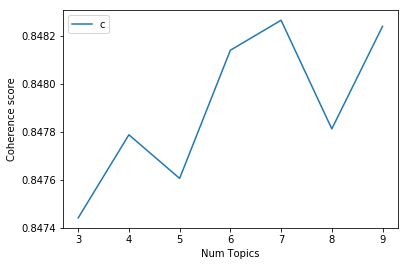

Num Topics = 3  has Coherence Value of 0.8474
Num Topics = 4  has Coherence Value of 0.8478
Num Topics = 5  has Coherence Value of 0.8476
Num Topics = 6  has Coherence Value of 0.8481
Num Topics = 7  has Coherence Value of 0.8483
Num Topics = 8  has Coherence Value of 0.8478
Num Topics = 9  has Coherence Value of 0.8482


In [87]:
# Show graph
limit=10; start=3; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()


# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

In [38]:
# Select the model and print the topics
optimal_model = model_list[6]  #best model
model_topics = optimal_model.show_topics(formatted=False)
pprint.pprint(optimal_model.print_topics(num_words=10))

[(0,
  '0.024*"아깝다/Adjective" + 0.022*"별/Noun" + 0.021*"중독/Noun" + 0.018*"개꿀/Noun" '
  '+ 0.018*"과/Noun" + 0.016*"심심하다/Adjective" + 0.016*"부터/Noun" + '
  '0.015*"돈/Noun" + 0.015*"구매/Noun" + 0.014*"걸/Noun"'),
 (1,
  '0.022*"전/Noun" + 0.021*"귀엽다/Adjective" + 0.018*"대박/Noun" + '
  '0.017*"아쉽다/Adjective" + 0.015*"겜/Noun" + 0.013*"시작/Noun" + 0.013*"버전/Noun" '
  '+ 0.012*"한글/Noun" + 0.012*"레벨/Noun" + 0.012*"와이파이/Noun"'),
 (2,
  '0.030*"어렵다/Adjective" + 0.025*"성/Noun" + 0.021*"안되다/Adjective" + '
  '0.020*"분/Noun" + 0.019*"렉/Noun" + 0.017*"친구/Noun" + 0.012*"모바일/Noun" + '
  '0.012*"너/Noun" + 0.012*"보고/Noun" + 0.011*"무섭다/Adjective"'),
 (3,
  '0.026*"돈/Noun" + 0.022*"줄/Noun" + 0.020*"맵/Noun" + 0.020*"좋아하다/Adjective" + '
  '0.016*"꼭/Noun" + 0.015*"무료/Noun" + 0.014*"캐릭터/Noun" + 0.013*"다운로드/Noun" + '
  '0.013*"버그/Noun" + 0.011*"머리/Noun"'),
 (4,
  '0.025*"제작자/Noun" + 0.022*"처음/Noun" + 0.021*"환불/Noun" + 0.020*"추천/Noun" + '
  '0.014*"영어/Noun" + 0.012*"판/Noun" + 0.011*"포우/Noun" + 0.010*"결제/Noun" + '
  '

In [44]:
def format_topics_sentences(ldamodel=lda_model, corpus=tf_ko, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), name_list[int(topic_num)], round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Document_name', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=tf_ko, texts=data)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Document_Name', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

# Show
df_dominant_topic.head(10)

,Document_No,Document_Name,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,1.0,Angry Birds Rio,0.2157,"전/Noun, 귀엽다/Adjective, 대박/Noun, 아쉽다/Adjective,...",[ 재밌고 즐겁습니다. 꿀 잼 매우 좋음 광고 없는 유료화를 해 주세요....
1,1,4.0,Draughts,0.2157,"제작자/Noun, 처음/Noun, 환불/Noun, 추천/Noun, 영어/Noun, ...",[ 와 너무 추억인데 게임이 변한 게 없어서 진짜 좋았다 중독성 재미이는 디...
2,2,3.0,Bubble Shooter,0.2070,"돈/Noun, 줄/Noun, 맵/Noun, 좋아하다/Adjective, 꼭/Noun...",[ 짱! 킬링타임용으로 좋음 Good 그럭저럭합니다 중독성이 강하네요...
3,3,4.0,Draughts,0.2157,"제작자/Noun, 처음/Noun, 환불/Noun, 추천/Noun, 영어/Noun, ...",[ 할 거 없을 때마다 하면 좋아요!:D 제가 단계를 다 깼는데 업데이트는 언제 되...
4,4,0.0,Angry Birds Classic,0.2113,"아깝다/Adjective, 별/Noun, 중독/Noun, 개꿀/Noun, 과/Nou...",[ 이겨서 좋다 영국 친구가 소개해줬어요. 진짜 재밌네요.]
5,5,4.0,Draughts,0.2157,"제작자/Noun, 처음/Noun, 환불/Noun, 추천/Noun, 영어/Noun, ...",[ 그러니 진짜 너무 재밌고 심심할 때 항상 하고 있는 게임이에요!! 한 가지 피드...
6,6,4.0,Draughts,0.2157,"제작자/Noun, 처음/Noun, 환불/Noun, 추천/Noun, 영어/Noun, ...",[ 꾸준한 업데이트 감사합니다. 차에 브레이크 등이 들어왔으면 좋을 거 같고 차량의...
7,7,0.0,Angry Birds Classic,0.2092,"아깝다/Adjective, 별/Noun, 중독/Noun, 개꿀/Noun, 과/Nou...",[ 이 게임 1년 만인데도 아직 옛날과 똑같네요 ㅎㅎ 진짜 재미있고 꿀만 잠 대...
8,8,4.0,Draughts,0.2157,"제작자/Noun, 처음/Noun, 환불/Noun, 추천/Noun, 영어/Noun, ...",[ 이거 PC에서는 화분 2500원인데 왜 5000원이죠? 돈 낭비가 되네요 그리고...
9,9,4.0,Draughts,0.2157,"제작자/Noun, 처음/Noun, 환불/Noun, 추천/Noun, 영어/Noun, ...",[ 굿~!! 재미있는 놀이였습니다. 200이 끝?? 아쉬워요 300까지 추가...


In [ ]:
bow = tfidf_model_ko[dictionary_ko.doc2bow(texts_ko[0])]
sorted(lsi_ko[bow], key=lambda x: x[1], reverse=True)
sorted(lda_ko[bow], key=lambda x: x[1], reverse=True)
sorted(hdp_ko[bow], key=lambda x: x[1], reverse=True)

In [ ]:
bow = tfidf_model_ko[dictionary_ko.doc2bow(texts_ko[1])]
sorted(lsi_ko[bow], key=lambda x: x[1], reverse=True)
sorted(lda_ko[bow], key=lambda x: x[1], reverse=True)
sorted(hdp_ko[bow], key=lambda x: x[1], reverse=True)

In [ ]:
ko = nltk.Text(result, name='token_ko')   
print(len(set(ko.tokens)))  # returns number of unique tokens
ko.vocab()                  # returns frequency distribution

from konlpy.tag import Twitter; t = Twitter()

pos = lambda d: ['/'.join(p) for p in t.pos(d, stem=True, norm=True)]
texts_ko = [pos(doc) for doc in ko]


#create id2word
from gensim import corpora
dictionary_ko = corpora.Dictionary(texts_ko)
#dictionary_ko.save(u'ko.dict')  # save dictionary to file for future use

from gensim import models
tf_ko = [dictionary_ko.doc2bow(text) for text in texts_ko]
tfidf_model_ko = models.TfidfModel(tf_ko)
tfidf_ko = tfidf_model_ko[tf_ko]
#corpora.MmCorpus.serialize('ko.mm', tfidf_ko) # save corpus to file for future use


import numpy as np; np.random.seed(42)  # optional
import pprint

ntopics = 5
nwords = 5

lda_ko = models.ldamodel.LdaModel(tfidf_ko, id2word=dictionary_ko, num_topics=ntopics)
pprint.pprint(lda_ko.print_topics(num_topics=ntopics, num_words=nwords))

from gensim.models import word2vec
wv_model_ko = word2vec.Word2Vec(texts_ko)
wv_model_ko.init_sims(replace=True)
#wv_model_ko.save('ko_word2vec.model')



import gensim

lda_model = gensim.models.ldamodel.LdaModel(corpus=tf_ko,
id2word=dictionary_ko,
num_topics=5,
random_state=100,
update_every=1,
chunksize=100,
passes=10,
alpha='auto',
per_word_topics=True)

doc_lda = lda_model[tf_ko]
print(doc_lda)
import pprint

pprint.pprint(lda_model.print_topics())


######
mallet_path = 'mallet-2.0.8/bin/mallet' # update this path
ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, corpus=tf_ko, num_topics=7, id2word=dictionary_ko)
pprint.pprint(ldamallet.show_topics(formatted=False))
